# Intro About Data:
This case study aims to give us an idea of applying EDA in a real business scenario. In this case study, apart from applying the techniques that we have learnt in the EDA module, we will also develop a basic understanding of risk analytics in banking and financial services and understand how data is used to minimise the risk of losing money while lending to customers.

# Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Importing Data and Performing basic Analysis:

In [2]:
app_df = pd.read_csv(r'Z:\My Work\To Upload on GITHUB\EDA Projects\Loan Defaulter\application_data.csv')

In [3]:
app_df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
app_df.shape

(307511, 122)

In [5]:
app_df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

In [6]:
# Displaying all Columns and Rows:
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [7]:
app_df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

# Selecting Important Features:


In [8]:
app_df.isnull().sum().sort_values()

SK_ID_CURR                           0
HOUR_APPR_PROCESS_START              0
REG_REGION_NOT_WORK_REGION           0
LIVE_REGION_NOT_WORK_REGION          0
REG_CITY_NOT_LIVE_CITY               0
REG_CITY_NOT_WORK_CITY               0
LIVE_CITY_NOT_WORK_CITY              0
ORGANIZATION_TYPE                    0
FLAG_DOCUMENT_21                     0
FLAG_DOCUMENT_20                     0
FLAG_DOCUMENT_19                     0
FLAG_DOCUMENT_18                     0
FLAG_DOCUMENT_17                     0
FLAG_DOCUMENT_16                     0
FLAG_DOCUMENT_15                     0
FLAG_DOCUMENT_14                     0
FLAG_DOCUMENT_13                     0
FLAG_DOCUMENT_12                     0
FLAG_DOCUMENT_11                     0
FLAG_DOCUMENT_10                     0
FLAG_DOCUMENT_9                      0
FLAG_DOCUMENT_8                      0
FLAG_DOCUMENT_7                      0
FLAG_DOCUMENT_6                      0
FLAG_DOCUMENT_5                      0
FLAG_DOCUMENT_4          

In [9]:
# Creating a dataframe for thr missing values:

msng_df = pd.DataFrame(app_df.isnull().sum().sort_values()).reset_index()
msng_df.rename(columns = {'index' : 'Column_Name', 0 : 'null_count'}, inplace = True)

In [10]:
msng_df

,Column_Name,null_count
0,SK_ID_CURR,0
1,HOUR_APPR_PROCESS_START,0
2,REG_REGION_NOT_WORK_REGION,0
3,LIVE_REGION_NOT_WORK_REGION,0
4,REG_CITY_NOT_LIVE_CITY,0
5,REG_CITY_NOT_WORK_CITY,0
6,LIVE_CITY_NOT_WORK_CITY,0
7,ORGANIZATION_TYPE,0
8,FLAG_DOCUMENT_21,0
9,FLAG_DOCUMENT_20,0


In [11]:
# Finding the percentage of the missing rowns in each column:

msng_df['msng_pcnt'] = msng_df['null_count']/app_df.shape[0]*100
msng_df

,Column_Name,null_count,msng_pcnt
0,SK_ID_CURR,0,0.000000
1,HOUR_APPR_PROCESS_START,0,0.000000
2,REG_REGION_NOT_WORK_REGION,0,0.000000
3,LIVE_REGION_NOT_WORK_REGION,0,0.000000
4,REG_CITY_NOT_LIVE_CITY,0,0.000000
5,REG_CITY_NOT_WORK_CITY,0,0.000000
6,LIVE_CITY_NOT_WORK_CITY,0,0.000000
7,ORGANIZATION_TYPE,0,0.000000
8,FLAG_DOCUMENT_21,0,0.000000
9,FLAG_DOCUMENT_20,0,0.000000


In [12]:
# Saving this as xlsx file:
# msng_df.to_excel(r'Z:\My Work\To Upload on GITHUB\EDA Projects\Loan Defaulter\missing_values.xlsx', index = False) already done


In [13]:
# Creating a list of columns with missing values:

msng_col = msng_df[msng_df['msng_pcnt'] >= 60]['Column_Name']

In [14]:
msng_col.to_list()

['OWN_CAR_AGE',
 'YEARS_BUILD_MODE',
 'YEARS_BUILD_AVG',
 'YEARS_BUILD_MEDI',
 'FLOORSMIN_AVG',
 'FLOORSMIN_MODE',
 'FLOORSMIN_MEDI',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAPARTMENTS_MEDI',
 'FONDKAPREMONT_MODE',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAPARTMENTS_MODE',
 'COMMONAREA_MODE',
 'COMMONAREA_AVG',
 'COMMONAREA_MEDI']

In [15]:
# Total number of missing value columns:
len(msng_col)

17

In [16]:
# Removing missing columns:

no_msng_app = app_df.drop(labels = msng_col, axis = 1)

In [17]:
# Making a list of all Flag Column:

Flag_col = []

for col in no_msng_app.columns:
    if col.startswith('FLAG_'):
        Flag_col.append(col)

Flag_col

['FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21']

In [18]:
len(Flag_col)

28

In [19]:
# Understanding the Flag Col:

no_msng_app[Flag_col].head()

,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
0,N,Y,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,N,N,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Y,Y,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,N,Y,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,N,Y,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [20]:
# Checking the Flag col with Target:

# Understanding the Flag Col:

no_msng_app[Flag_col + ['TARGET']].head()

,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,TARGET
0,N,Y,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,N,N,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Y,Y,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,N,Y,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,N,Y,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [21]:
# Storing this in a seprate variable:

flag_tar_col = no_msng_app[Flag_col + ['TARGET']]
flag_tar_col.head()

,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,TARGET
0,N,Y,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,N,N,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Y,Y,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,N,Y,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,N,Y,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


<AxesSubplot:xlabel='FLAG_DOCUMENT_2', ylabel='count'>

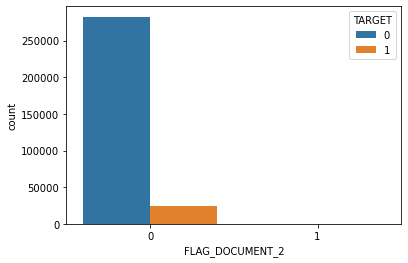

In [22]:
# Checking the Flag with target:

sns.countplot(data = flag_tar_col, x = 'FLAG_DOCUMENT_2', hue = 'TARGET')

Most of the People who did not submitted FLAG_DOCUMENT_2 are Non Defaulters. **TARGET column has 0 and 1 as elements where 0 means that the customer is non defaulter and 1 is that the customer is defaulter.**

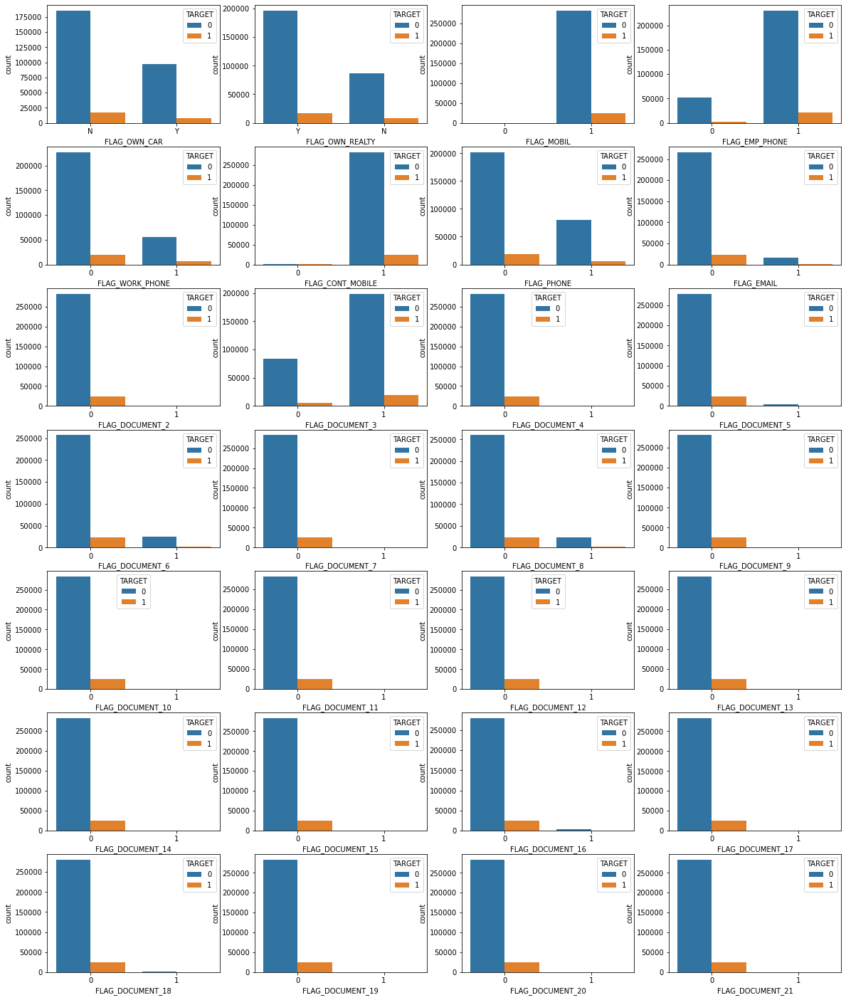

In [23]:
# Plotting all the Flag col with target:
plt.figure(figsize = (20,25))

for i, col in enumerate(Flag_col): # This will print all the Flag Columns with it's index
    plt.subplot(7,4,i+1) #7 rows, 4 columns and i + 1: increase the rank as the itereation starts.
    sns.countplot(data = flag_tar_col, x = col, hue = 'TARGET')

From this we can conclude that:
1. Most of the people who submitted flag documents are non defaulters.
2. People who submitted document:
* Flag_Document_3 : Out of all the Flag Documents, these were the highest submitted however it has few defaulters but mostly non defaulters.
* Flag_Document_5 : Had few document submitted but no defaulters.
* Flag_Document_6 : Had few document submitted out of which it had had very few defaulters.
* Flag_Document_8 : Had few document submitted out of which it had had very few defaulters.
* Flag_Document_16 : Had few document submitted but no defaulters.
* Flag_Document_18 : Had few document submitted but no defaulters.

<AxesSubplot:>

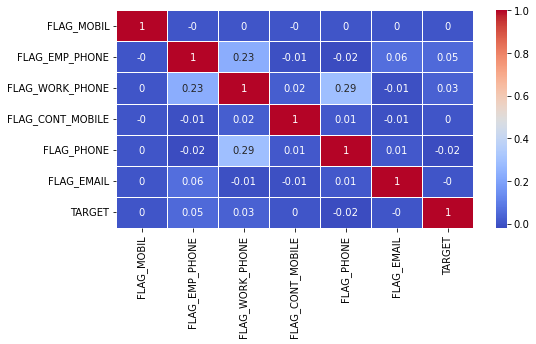

In [24]:
# Finding categorical Flag correlation with target:

flg_corr = ['FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'FLAG_MOBIL', 'FLAG_EMP_PHONE','FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
            'FLAG_PHONE', 'FLAG_EMAIL', 'TARGET']
app_flg_corr = no_msng_app[flg_corr]

corr_df = round(app_flg_corr.corr(),2)

plt.figure(figsize = (8,4))
sns.heatmap(corr_df, cmap = 'coolwarm', linewidths = 0.5, annot = True)

In [25]:
# Converting 0,1 to N and Y:

app_flg_corr['FLAG_OWN_CAR'] = app_flg_corr['FLAG_OWN_CAR'].replace({'N' : 0, 'Y' : 1})
app_flg_corr['FLAG_OWN_REALTY'] = app_flg_corr['FLAG_OWN_REALTY'].replace({'N' : 0, 'Y' : 1})
app_flg_corr['FLAG_MOBIL'] = app_flg_corr['FLAG_MOBIL'].replace({'N' : 0, 'Y' : 1})
app_flg_corr['FLAG_EMP_PHONE'] = app_flg_corr['FLAG_EMP_PHONE'].replace({'N' : 0, 'Y' : 1})
app_flg_corr['FLAG_WORK_PHONE'] = app_flg_corr['FLAG_WORK_PHONE'].replace({'N' : 0, 'Y' : 1})
app_flg_corr['FLAG_CONT_MOBILE'] = app_flg_corr['FLAG_CONT_MOBILE'].replace({'N' : 0, 'Y' : 1})
app_flg_corr['FLAG_PHONE'] = app_flg_corr['FLAG_PHONE'].replace({'N' : 0, 'Y' : 1})
app_flg_corr['FLAG_EMAIL'] = app_flg_corr['FLAG_EMAIL'].replace({'N' : 0, 'Y' : 1})

C:\Users\91911\AppData\Local\Temp\ipykernel_11708\1373405192.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app_flg_corr['FLAG_OWN_CAR'] = app_flg_corr['FLAG_OWN_CAR'].replace({'N' : 0, 'Y' : 1})
C:\Users\91911\AppData\Local\Temp\ipykernel_11708\1373405192.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app_flg_corr['FLAG_OWN_REALTY'] = app_flg_corr['FLAG_OWN_REALTY'].replace({'N' : 0, 'Y' : 1})
C:\Users\91911\AppData\Local\Temp\ipykernel_11708\1373405192.py:5: SettingWithCopyWarning: 
A value is t

<AxesSubplot:>

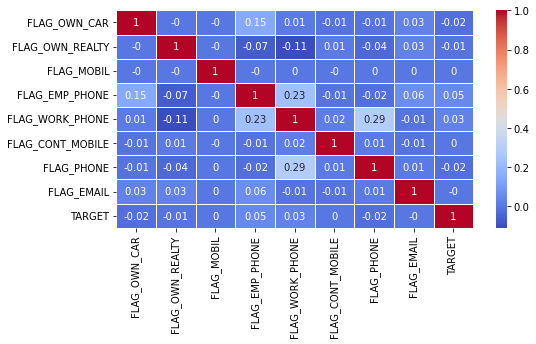

In [26]:
corr_df = round(app_flg_corr.corr(),2)

plt.figure(figsize = (8,4))
sns.heatmap(corr_df, cmap = 'coolwarm', linewidths = 0.5, annot = True)

No Correlation is there between target and these categorical flags. Meaning that there is no sign of positivity that people who own above stated flags have any relation with being Defaulters.

In [27]:
# Dropping the unwanted Flag Columns:

no_msng_app = no_msng_app.drop(labels = ['FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'FLAG_MOBIL', 'FLAG_EMP_PHONE','FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
            'FLAG_PHONE', 'FLAG_EMAIL'], axis = 1)
no_msng_app.shape

(307511, 97)

In [28]:
# Correlation between Flag Documents:
flag_doc = ['FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21','TARGET']

corr_flg_doc = no_msng_app[flag_doc]

<AxesSubplot:>

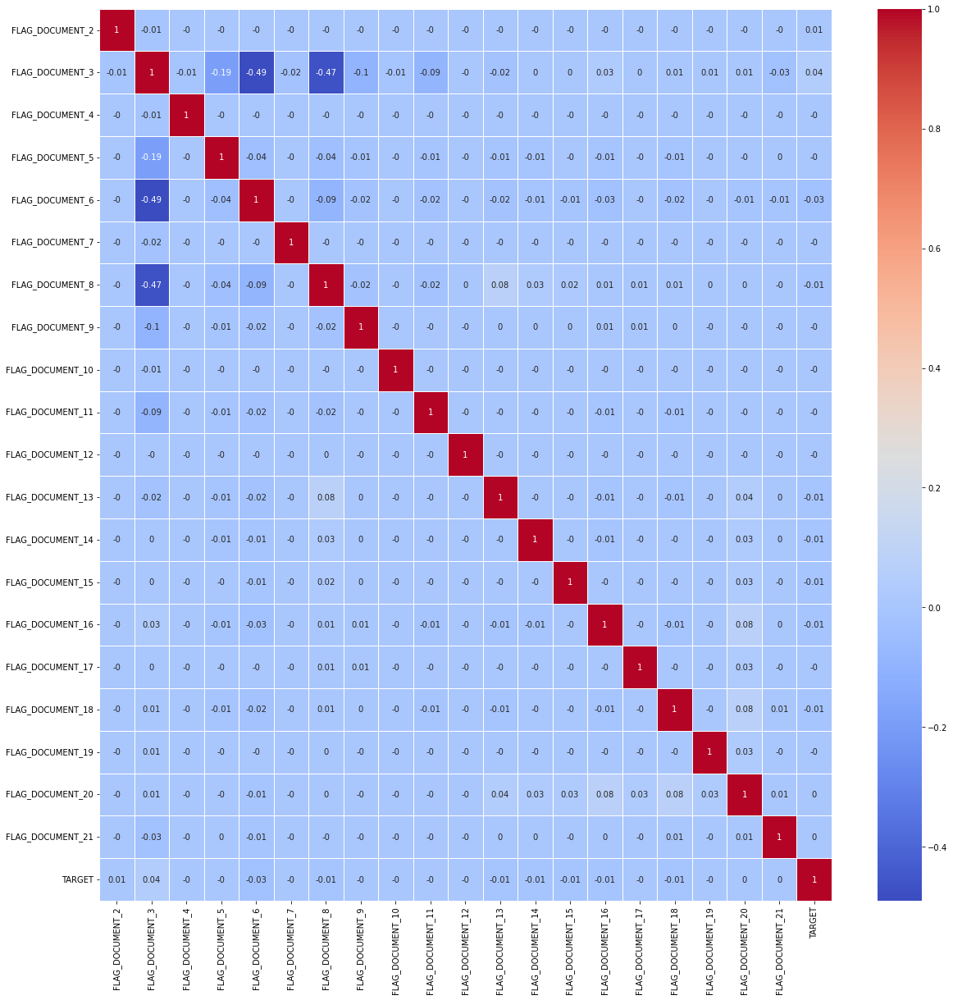

In [29]:
corr_df = round(corr_flg_doc.corr(),2)

plt.figure(figsize = (20,20))
sns.heatmap(corr_df, cmap = 'coolwarm', linewidths = 0.5, annot = True)

No Strong Correlation between Target and Flag Documents. We will drop the flag documents as well.

In [30]:
# Dropping Flag Documents:

no_msng_app = no_msng_app.drop(labels = ['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21'], axis = 1)

no_msng_app.shape

(307511, 77)

In [31]:
# Finding correlation between exit variable:

ext_col = []

for col in no_msng_app.columns:
    if col.startswith('EXT_'):
        ext_col.append(col)

ext_col

['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']

<AxesSubplot:>

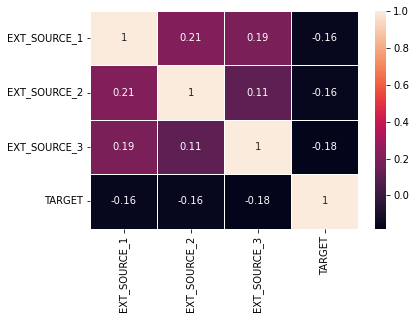

In [32]:
sns.heatmap(data = round(no_msng_app[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'TARGET']].corr(),2), linewidths = 0.5, annot = True )

No strong relationship found between target and EXT Source and TARGET.

In [33]:
# Dropping EXT Sources 

no_msng_app = no_msng_app.drop(labels = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3'], axis = 1)

no_msng_app.shape

(307511, 74)

# Feature Engineering:

In [34]:
app = no_msng_app

In [35]:
app.isnull().sum().sort_values()

SK_ID_CURR                           0
LIVE_CITY_NOT_WORK_CITY              0
REG_CITY_NOT_WORK_CITY               0
REG_CITY_NOT_LIVE_CITY               0
LIVE_REGION_NOT_WORK_REGION          0
REG_REGION_NOT_WORK_REGION           0
REG_REGION_NOT_LIVE_REGION           0
HOUR_APPR_PROCESS_START              0
WEEKDAY_APPR_PROCESS_START           0
REGION_RATING_CLIENT_W_CITY          0
REGION_RATING_CLIENT                 0
DAYS_ID_PUBLISH                      0
DAYS_REGISTRATION                    0
ORGANIZATION_TYPE                    0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
NAME_HOUSING_TYPE                    0
NAME_FAMILY_STATUS                   0
NAME_EDUCATION_TYPE                  0
TARGET                               0
NAME_CONTRACT_TYPE                   0
NAME_INCOME_TYPE                     0
CODE_GENDER                          0
CNT_CHILDREN                         0
REGION_POPULATION_RELATIVE           0
AMT_CREDIT               

In [36]:
# Percentage of Null values in each columns:
app.isnull().sum().sort_values()/app.shape[0]

SK_ID_CURR                      0.000000
LIVE_CITY_NOT_WORK_CITY         0.000000
REG_CITY_NOT_WORK_CITY          0.000000
REG_CITY_NOT_LIVE_CITY          0.000000
LIVE_REGION_NOT_WORK_REGION     0.000000
REG_REGION_NOT_WORK_REGION      0.000000
REG_REGION_NOT_LIVE_REGION      0.000000
HOUR_APPR_PROCESS_START         0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
REGION_RATING_CLIENT_W_CITY     0.000000
REGION_RATING_CLIENT            0.000000
DAYS_ID_PUBLISH                 0.000000
DAYS_REGISTRATION               0.000000
ORGANIZATION_TYPE               0.000000
DAYS_BIRTH                      0.000000
DAYS_EMPLOYED                   0.000000
NAME_HOUSING_TYPE               0.000000
NAME_FAMILY_STATUS              0.000000
NAME_EDUCATION_TYPE             0.000000
TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
NAME_INCOME_TYPE                0.000000
CODE_GENDER                     0.000000
CNT_CHILDREN                    0.000000
REGION_POPULATIO

### Missing Values Imputation:

### Categorical Data with null values:

1. CNT_FAM_MEMBERS
2. NAME_TYPE_SUITE
3. OCCUPATION_TYPE

In [37]:
# Handling missing values in CNT_FAM_MEMBERS:
app['CNT_FAM_MEMBERS'].value_counts()

2.0     158357
1.0      67847
3.0      52601
4.0      24697
5.0       3478
6.0        408
7.0         81
8.0         20
9.0          6
10.0         3
14.0         2
12.0         2
20.0         2
16.0         2
13.0         1
15.0         1
11.0         1
Name: CNT_FAM_MEMBERS, dtype: int64

In [38]:
print('Most of the family has',int(app['CNT_FAM_MEMBERS'].mode()[0]), 'members in their family.')

Most of the family has 2 members in their family.


In [39]:
# Filling null values on CNT_FAM_MEMBERS:

app['CNT_FAM_MEMBERS'] = app['CNT_FAM_MEMBERS'].fillna(app['CNT_FAM_MEMBERS'].mode()[0])

In [40]:
app['CNT_FAM_MEMBERS'].isnull().sum()

0

In [41]:
# Handling missing values in NAME_TYPE_SUITE:
app['NAME_TYPE_SUITE'].isnull().sum()

1292

In [42]:
app['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

In [43]:
print('Most of the client were', app['NAME_TYPE_SUITE'].mode()[0], 'while applying for the loan.')

Most of the client were Unaccompanied while applying for the loan.


In [44]:
# Fillling the null values of NAME_TYPE_SUITE:


In [45]:
app['NAME_TYPE_SUITE'] = app['NAME_TYPE_SUITE'].fillna(app['NAME_TYPE_SUITE'].mode()[0])

In [46]:
app['NAME_TYPE_SUITE'].isnull().sum()

0

In [47]:
app['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      249818
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

In [48]:
# Handling missing values in OCCUPATION_TYPE:
app['OCCUPATION_TYPE'].isnull().sum()

96391

In [49]:
app['OCCUPATION_TYPE'].value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [50]:
print('Most of the client were', app['OCCUPATION_TYPE'].mode()[0], 'by their occupation')

Most of the client were Laborers by their occupation


In [51]:
# Fill null values of OCCUPATION_TYPE:
app['OCCUPATION_TYPE'] = app['OCCUPATION_TYPE'].fillna(app['OCCUPATION_TYPE'].mode()[0])

In [52]:
app['OCCUPATION_TYPE'].isnull().sum()

0

In [53]:
app['OCCUPATION_TYPE'].value_counts()

Laborers                 151577
Sales staff               32102
Core staff                27570
Managers                  21371
Drivers                   18603
High skill tech staff     11380
Accountants                9813
Medicine staff             8537
Security staff             6721
Cooking staff              5946
Cleaning staff             4653
Private service staff      2652
Low-skill Laborers         2093
Waiters/barmen staff       1348
Secretaries                1305
Realty agents               751
HR staff                    563
IT staff                    526
Name: OCCUPATION_TYPE, dtype: int64

### Quantitative Data with null values:

1. AMT_ANNUITY
2. AMT_GOODS_PRICE
3. OBS_60_CNT_SOCIAL_CIRCLE
4. OBS_30_CNT_SOCIAL_CIRCLE
5. DEF_60_CNT_SOCIAL_CIRCLE
6. DEF_30_CNT_SOCIAL_CIRCLE
7. AMT_REQ_CREDIT_BUREAU_HOUR
8. AMT_REQ_CREDIT_BUREAU_WEEK
9. AMT_REQ_CREDIT_BUREAU_DAY
10. AMT_REQ_CREDIT_BUREAU_MON
11. AMT_REQ_CREDIT_BUREAU_YEAR
12. AMT_REQ_CREDIT_BUREAU_QRT
13. EMERGENCYSTATE_MODE
14. TOTALAREA_MODE
15. YEARS_BEGINEXPLUATATION_MODE
16. YEARS_BEGINEXPLUATATION_AVG
17. YEARS_BEGINEXPLUATATION_MEDI
18. FLOORSMAX_MODE
19. FLOORSMAX_AVG
20. FLOORSMAX_MEDI
21. HOUSETYPE_MODE
22. LIVINGAREA_MEDI
23. LIVINGAREA_MODE
24. LIVINGAREA_AVG
25. ENTRANCES_AVG
26. ENTRANCES_MEDI
27. ENTRANCES_MODE
28. APARTMENTS_MODE
29. APARTMENTS_MEDI
30. APARTMENTS_AVG
31. WALLSMATERIAL_MODE
32. ELEVATORS_MEDI
33. ELEVATORS_AVG
34. ELEVATORS_MODE
35. NONLIVINGAREA_AVG
36. NONLIVINGAREA_MEDI
37. NONLIVINGAREA_MODE
38. BASEMENTAREA_MEDI
39. BASEMENTAREA_MODE
40. BASEMENTAREA_AVG
41. LANDAREA_MEDI
42. LANDAREA_MODE
43. LANDAREA_AVG

In [54]:
# Handling missing values in AMT_ANNUITY:

app['AMT_ANNUITY'].isnull().sum()

12

In [55]:
app['AMT_ANNUITY'].describe()

count    307499.000000
mean      27108.573909
std       14493.737315
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

As we can see that mean and median are close to each other (mean = 27108.573909 and median = 24903.000000, not exactly close but quite same) meaning that the data is not highly imbalanced. So we can use the mean value to fill the missing value.

In [56]:
# Filling null values in AMT_ANNUITY:
app['AMT_ANNUITY'] = app['AMT_ANNUITY'].fillna(app['AMT_ANNUITY'].mean())

In [57]:
app['AMT_ANNUITY'].isnull().sum()

0

In [58]:
app['AMT_ANNUITY'].describe()

count    307511.000000
mean      27108.573909
std       14493.454517
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

In [59]:
# Hnadling missing values in AMT_GOODS_PRICE:

app['AMT_GOODS_PRICE'].isnull().sum()

278

In [60]:
app['AMT_GOODS_PRICE'].value_counts()

450000.0     26022
225000.0     25282
675000.0     24962
900000.0     15416
270000.0     11428
180000.0     10123
454500.0      9157
1125000.0     9050
135000.0      8206
315000.0      5225
1350000.0     5037
679500.0      4824
238500.0      4696
360000.0      4553
247500.0      4318
463500.0      3873
540000.0      3763
495000.0      3463
202500.0      3222
90000.0       3169
405000.0      2954
472500.0      2828
157500.0      2704
585000.0      2647
337500.0      2501
229500.0      2438
112500.0      2170
630000.0      2164
1800000.0     2146
720000.0      1922
1575000.0     1875
688500.0      1824
292500.0      1708
148500.0      1674
477000.0      1611
810000.0      1568
67500.0       1505
697500.0      1408
382500.0      1396
765000.0      1396
904500.0      1375
283500.0      1372
252000.0      1368
234000.0      1279
45000.0       1169
945000.0      1161
855000.0      1113
1129500.0     1109
913500.0      1065
328500.0      1059
459000.0      1023
193500.0      1007
103500.0    

In [61]:
app['AMT_GOODS_PRICE'].describe()

count    3.072330e+05
mean     5.383962e+05
std      3.694465e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

Will use aggregation to understand the min, max and median of the data.

In [62]:
app['AMT_GOODS_PRICE'].agg(['min', 'max', 'median'])

min         40500.0
max       4050000.0
median     450000.0
Name: AMT_GOODS_PRICE, dtype: float64

In [63]:
app['AMT_GOODS_PRICE'].mean()

538396.2074288895

We can use the median as it seems much more relevent to min, max rather than median which looks like max value instead. 
There are chances that this data could have outliers in it.

In [64]:
# Filling null values with the median:
app['AMT_GOODS_PRICE'] = app['AMT_GOODS_PRICE'].fillna(app['AMT_GOODS_PRICE'].median())

In [65]:
app['AMT_GOODS_PRICE'].isnull().sum()

0

Handling missing values in OBS_60_CNT_SOCIAL_CIRCLE
OBS_30_CNT_SOCIAL_CIRCLE
DEF_60_CNT_SOCIAL_CIRCLE
DEF_30_CNT_SOCIAL_CIRCLE:

as this data consists of wehther there were any changes in social surrounding before days due pasts, we will ignore this for now and if this data forms any correlation than we will handle the missing values of this data.

In [66]:
# Handling missing values in AMT_REQ_CREDIT_BUREAU_HOUR:
app['AMT_REQ_CREDIT_BUREAU_HOUR'].isnull().sum()

41519

In [67]:
app['AMT_REQ_CREDIT_BUREAU_HOUR'].describe()

count    265992.000000
mean          0.006402
std           0.083849
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           4.000000
Name: AMT_REQ_CREDIT_BUREAU_HOUR, dtype: float64

In [68]:
app['AMT_REQ_CREDIT_BUREAU_HOUR'].unique()

array([ 0., nan,  1.,  2.,  3.,  4.])

In [69]:
app['AMT_REQ_CREDIT_BUREAU_HOUR'].median()

0.0

In [70]:
amt_req_col = []

for col in app.columns:
    if col.startswith("AMT_REQ_CREDIT_"):
        amt_req_col.append(col)

In [71]:
for col in amt_req_col:
    app[col] = app[col].fillna(app[col].median())

In [72]:
app[col].isnull().sum()

0

In [73]:
app.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                          0
AMT_GOODS_PRICE                      0
NAME_TYPE_SUITE                      0
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OCCUPATION_TYPE                      0
CNT_FAM_MEMBERS                      0
REGION_RATING_CLIENT                 0
REGION_RATING_CLIENT_W_CITY          0
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
REG_REGION_NOT_LIVE_REGIO

## Removing Features that are not compatible for analysis:

In [74]:
null_count = app.isnull().sum()

variables_with_null_values = []

for col, con in null_count.iteritems():
    if con > 2000:
        variables_with_null_values.append(col)
    

In [75]:
variables_with_null_values

['APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'LANDAREA_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'LANDAREA_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAREA_MEDI',
 'HOUSETYPE_MODE',
 'TOTALAREA_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

In [76]:
app = app.drop(labels = variables_with_null_values , axis = 1)

In [77]:
app.isnull().sum()

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
CNT_CHILDREN                      0
AMT_INCOME_TOTAL                  0
AMT_CREDIT                        0
AMT_ANNUITY                       0
AMT_GOODS_PRICE                   0
NAME_TYPE_SUITE                   0
NAME_INCOME_TYPE                  0
NAME_EDUCATION_TYPE               0
NAME_FAMILY_STATUS                0
NAME_HOUSING_TYPE                 0
REGION_POPULATION_RELATIVE        0
DAYS_BIRTH                        0
DAYS_EMPLOYED                     0
DAYS_REGISTRATION                 0
DAYS_ID_PUBLISH                   0
OCCUPATION_TYPE                   0
CNT_FAM_MEMBERS                   0
REGION_RATING_CLIENT              0
REGION_RATING_CLIENT_W_CITY       0
WEEKDAY_APPR_PROCESS_START        0
HOUR_APPR_PROCESS_START           0
REG_REGION_NOT_LIVE_REGION        0
REG_REGION_NOT_WORK_REGION        0
LIVE_REGION_NOT_WORK_REGION 

In [78]:
app.shape

(307511, 43)

The features that we dropped were mostly about the size of the apartment, land area, carpet area and etc. Most of the features had more than 60% null values and were not needed to make any important analysis on behalf of them.

In [79]:
unwanted_feature = variables_with_null_values

In [80]:
# Here is the list of unwanted feature for this EDA:

unwanted_feature

['APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'LANDAREA_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'LANDAREA_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAREA_MEDI',
 'HOUSETYPE_MODE',
 'TOTALAREA_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

Majority of these were normalized, if in case needed in building prediction model we have already stored those data in a different variable labled as 'unwanted_data' for safety measures.

# Value Modification:

In [81]:
app.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,2.0,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.0,0.0,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,2.0,0.0,2.0,0.0,-617.0,0.0,0.0,0.0,0.0,0.0,1.0
4,100007,0,Cash loans,M,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.0,0.0,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0


As we can see that days columns consists of data in negative variables.

In [82]:
# Creating a variavle that consists of all the features DAY:

days_app = []

for col in app.columns:
    if col.startswith("DAYS_"):
        days_app.append(col)

In [83]:
days_app

['DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'DAYS_LAST_PHONE_CHANGE']

In [84]:
# To Convert the values from negative to positive:

for col in days_app:
    app[col] = abs(app[col])

In [85]:
app.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,2.0,2.0,2.0,2.0,1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046,225,4260.0,2531,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.0,0.0,0.0,0.0,815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,19005,3039,9833.0,2437,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,2.0,0.0,2.0,0.0,617.0,0.0,0.0,0.0,0.0,0.0,1.0
4,100007,0,Cash loans,M,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,19932,3038,4311.0,3458,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.0,0.0,0.0,0.0,1106.0,0.0,0.0,0.0,0.0,0.0,0.0


So now our Days column is converted from negative to positive.

In [86]:
len(app.columns)

43

In [87]:
# Checking the data type of each feature:

app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   CNT_CHILDREN                 307511 non-null  int64  
 5   AMT_INCOME_TOTAL             307511 non-null  float64
 6   AMT_CREDIT                   307511 non-null  float64
 7   AMT_ANNUITY                  307511 non-null  float64
 8   AMT_GOODS_PRICE              307511 non-null  float64
 9   NAME_TYPE_SUITE              307511 non-null  object 
 10  NAME_INCOME_TYPE             307511 non-null  object 
 11  NAME_EDUCATION_TYPE          307511 non-null  object 
 12  NAME_FAMILY_STATUS           307511 non-null  object 
 13 

In [88]:
# Checking the number of unique values in each feature:

app.nunique().sort_values()

LIVE_REGION_NOT_WORK_REGION         2
TARGET                              2
NAME_CONTRACT_TYPE                  2
REG_REGION_NOT_LIVE_REGION          2
REG_CITY_NOT_LIVE_CITY              2
REG_CITY_NOT_WORK_CITY              2
LIVE_CITY_NOT_WORK_CITY             2
REG_REGION_NOT_WORK_REGION          2
REGION_RATING_CLIENT_W_CITY         3
REGION_RATING_CLIENT                3
CODE_GENDER                         3
NAME_EDUCATION_TYPE                 5
AMT_REQ_CREDIT_BUREAU_HOUR          5
NAME_HOUSING_TYPE                   6
NAME_FAMILY_STATUS                  6
WEEKDAY_APPR_PROCESS_START          7
NAME_TYPE_SUITE                     7
NAME_INCOME_TYPE                    8
AMT_REQ_CREDIT_BUREAU_DAY           9
DEF_60_CNT_SOCIAL_CIRCLE            9
AMT_REQ_CREDIT_BUREAU_WEEK          9
DEF_30_CNT_SOCIAL_CIRCLE           10
AMT_REQ_CREDIT_BUREAU_QRT          11
CNT_CHILDREN                       15
CNT_FAM_MEMBERS                    17
OCCUPATION_TYPE                    18
HOUR_APPR_PR

We will create bins for the data who has float data type and has characterstics required for creating a bin.

# Variable Evaluation:

In [89]:
app['AMT_GOODS_PRICE'].agg(['min', 'max', 'median'])

min         40500.0
max       4050000.0
median     450000.0
Name: AMT_GOODS_PRICE, dtype: float64

Half of the goods price are bellow 450000.0 but there is a sudden increase in max value which is 4050000.0 let's check if there are any outliers.

<AxesSubplot:xlabel='AMT_GOODS_PRICE', ylabel='Density'>

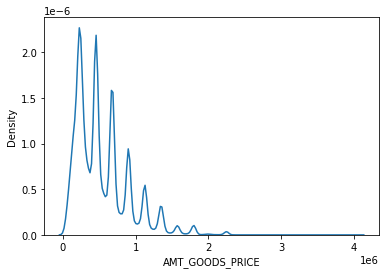

In [90]:
sns.kdeplot(data = app, x = 'AMT_GOODS_PRICE')

Data is rightly skeewed.

<AxesSubplot:xlabel='AMT_GOODS_PRICE'>

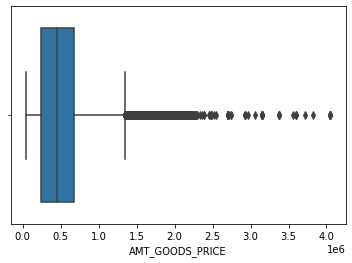

In [91]:
sns.boxplot(data = app, x = 'AMT_GOODS_PRICE')

# Binning:

In [92]:
bins_AMT = [0, 100000, 200000, 300000, 400000, 500000, 600000, 700000, 800000, 900000, 4050000]
AMT_Good_price_label = ['0-100k', '100k - 200k', '200k - 300k', '300k - 400k', '400k - 500k',
                       '500k - 600k','600k - 700k','700k - 800k','800k - 900k', 'Above 900k']

app['AMT_GOODS_PRICE_RANGE'] = pd.cut(app['AMT_GOODS_PRICE'], bins = bins_AMT, labels = AMT_Good_price_label)

In [93]:
app.groupby(['AMT_GOODS_PRICE_RANGE']).size()

AMT_GOODS_PRICE_RANGE
0-100k          8709
100k - 200k    32956
200k - 300k    62761
300k - 400k    21219
400k - 500k    57251
500k - 600k    13117
600k - 700k    40024
700k - 800k     8110
800k - 900k    21484
Above 900k     41880
dtype: int64

In [94]:
app.nunique().sort_values()

TARGET                              2
NAME_CONTRACT_TYPE                  2
REG_REGION_NOT_LIVE_REGION          2
REG_REGION_NOT_WORK_REGION          2
LIVE_REGION_NOT_WORK_REGION         2
REG_CITY_NOT_LIVE_CITY              2
REG_CITY_NOT_WORK_CITY              2
LIVE_CITY_NOT_WORK_CITY             2
REGION_RATING_CLIENT                3
REGION_RATING_CLIENT_W_CITY         3
CODE_GENDER                         3
NAME_EDUCATION_TYPE                 5
AMT_REQ_CREDIT_BUREAU_HOUR          5
NAME_FAMILY_STATUS                  6
NAME_HOUSING_TYPE                   6
WEEKDAY_APPR_PROCESS_START          7
NAME_TYPE_SUITE                     7
NAME_INCOME_TYPE                    8
DEF_60_CNT_SOCIAL_CIRCLE            9
AMT_REQ_CREDIT_BUREAU_DAY           9
AMT_REQ_CREDIT_BUREAU_WEEK          9
DEF_30_CNT_SOCIAL_CIRCLE           10
AMT_GOODS_PRICE_RANGE              10
AMT_REQ_CREDIT_BUREAU_QRT          11
CNT_CHILDREN                       15
CNT_FAM_MEMBERS                    17
OCCUPATION_T

In [95]:
# Binning AMT_INCOME_TOTAL:

app['AMT_INCOME_TOTAL'].quantile([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99])

0.10     81000.0
0.20     99000.0
0.30    112500.0
0.40    135000.0
0.50    147150.0
0.60    162000.0
0.70    180000.0
0.80    225000.0
0.90    270000.0
0.99    472500.0
Name: AMT_INCOME_TOTAL, dtype: float64

In [96]:
app['AMT_INCOME_TOTAL'].agg(['min', 'median', 'max'])

min           25650.0
median       147150.0
max       117000000.0
Name: AMT_INCOME_TOTAL, dtype: float64

In [97]:
bins_income = [0, 50000, 100000, 150000, 200000, 250000, 300000, 350000, 400000, 450000, 472500]
labels_income = ['0 - 50k', '50k - 100k', '100k - 150k', '150k - 200k', '200k - 250k', '250k - 300k',
                '300k - 350k', '350k - 400k', '400k - 450k', 'Above 400k']

app['AMT_INCOME_TOTAL_RANGE'] = pd.cut(app['AMT_INCOME_TOTAL'], bins = bins_income, labels = labels_income)

In [98]:
app.groupby(['AMT_INCOME_TOTAL_RANGE']).size()

AMT_INCOME_TOTAL_RANGE
0 - 50k         4517
50k - 100k     59181
100k - 150k    91591
150k - 200k    64307
200k - 250k    48137
250k - 300k    17039
300k - 350k     8874
350k - 400k     5802
400k - 450k     4924
Above 400k       125
dtype: int64

In [99]:
# Binning AMT_CREDIT:
app['AMT_CREDIT'].quantile([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99])

0.10     180000.0
0.20     254700.0
0.30     306306.0
0.40     432000.0
0.50     513531.0
0.60     604152.0
0.70     755190.0
0.80     900000.0
0.90    1133748.0
0.99    1854000.0
Name: AMT_CREDIT, dtype: float64

In [100]:
app['AMT_CREDIT'].agg(['min', 'max', 'median'])

min         45000.0
max       4050000.0
median     513531.0
Name: AMT_CREDIT, dtype: float64

In [101]:
bins_credit = [0, 200000, 300000, 400000, 500000, 600000, 700000, 800000, 900000, 1000000, 1854000]
label_credit = ['0 - 200k', '200k - 300k', '300k - 400k', '400k - 500k', '500k - 600k', '600k - 700k',
               '700k - 800k', '800k - 900k' ,'900k - 1M', 'Above 1M']

app['AMT_CREDIT_RANGE'] = pd.cut(app['AMT_CREDIT'], bins = bins_credit, labels = label_credit)

In [102]:
app.groupby(['AMT_CREDIT_RANGE']).size()

AMT_CREDIT_RANGE
0 - 200k       36144
200k - 300k    54813
300k - 400k    26338
400k - 500k    32038
500k - 600k    34232
600k - 700k    24049
700k - 800k    19193
800k - 900k    21792
900k - 1M       8927
Above 1M       46910
dtype: int64

In [103]:
# Binning AMT_ANNUITY:
app['AMT_ANNUITY'].quantile([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99])

0.10    11074.5
0.20    14701.5
0.30    18189.0
0.40    21870.0
0.50    24903.0
0.60    28062.0
0.70    32004.0
0.80    37516.5
0.90    45954.0
0.99    70006.5
Name: AMT_ANNUITY, dtype: float64

In [104]:
app['AMT_ANNUITY'].agg(['min', 'max', 'median'])

min         1615.5
max       258025.5
median     24903.0
Name: AMT_ANNUITY, dtype: float64

In [105]:
bins_annuity = [0, 10000, 20000, 30000, 40000, 50000, 60000, 70000, 258025]
label_annuity = ['0 - 10k', '10k - 20k', '20k - 30k', '30k - 40k', '40k - 50k', '50k - 60k',
                '60k - 70k', 'Above 70K']

app['AMT_ANNUITY_RANGE'] = pd.cut(app['AMT_ANNUITY'], bins = bins_annuity, labels = label_annuity)

In [106]:
app.groupby(['AMT_ANNUITY_RANGE']).size()

AMT_ANNUITY_RANGE
0 - 10k      23283
10k - 20k    83222
20k - 30k    92478
30k - 40k    58562
40k - 50k    28669
50k - 60k    13165
60k - 70k     5051
Above 70K     3080
dtype: int64

In [107]:
# Binning DAYS_EMPLOYED:

app['DAYS_EMPLOYED'].agg(['min', 'max', 'median'])

min            0.0
max       365243.0
median      2219.0
Name: DAYS_EMPLOYED, dtype: float64

In [108]:
app['DAYS_EMPLOYED'].quantile([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99])

0.10       392.0
0.20       749.0
0.30      1132.0
0.40      1597.0
0.50      2219.0
0.60      3032.0
0.70      4435.0
0.80      9188.0
0.90    365243.0
0.99    365243.0
Name: DAYS_EMPLOYED, dtype: float64

In [109]:
bins_employed = [0, 1825, 3650, 5475, 7300, 9125, 10950, 12775, 14600, 16425, 18250, 365243]
label_employed = ['0 - 5Y', '5Y - 10Y', '10Y - 15Y', '15Y - 20Y', '20Y - 25Y', '25Y - 30Y',
                '30Y - 35Y', '35Y - 40Y', '40Y - 45Y', '45Y - 50Y', 'Above 50Y']

app['DAYS_EMPLOYED_RANGE'] = pd.cut(app['DAYS_EMPLOYED'], bins = bins_employed, labels = label_employed)

In [110]:
app.groupby(['DAYS_EMPLOYED_RANGE']).size()

DAYS_EMPLOYED_RANGE
0 - 5Y       136309
5Y - 10Y      64872
10Y - 15Y     27549
15Y - 20Y     10849
20Y - 25Y      6243
25Y - 30Y      3308
30Y - 35Y      1939
35Y - 40Y       832
40Y - 45Y       210
45Y - 50Y        24
Above 50Y     55374
dtype: int64

In [111]:
# Binning DAYS_BIRTH:

app['DAYS_BIRTH'].agg(['min', 'max', 'median'])

min        7489.0
max       25229.0
median    15750.0
Name: DAYS_BIRTH, dtype: float64

In [112]:
app['DAYS_BIRTH'].quantile([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99])

0.10    10284.0
0.20    11694.0
0.30    13140.0
0.40    14416.0
0.50    15750.0
0.60    17220.0
0.70    18885.0
0.80    20474.0
0.90    22181.0
0.99    24419.0
Name: DAYS_BIRTH, dtype: float64

In [113]:
bins_birth = [0, 7300, 10950, 14600, 18250, 21900, 25229]
labels_birth = ['20Y', '20Y - 30Y', '30Y - 40Y', '40Y - 50Y', '50Y - 60Y', 'Above 60Y']

app['DAYS_BIRTH_RANGE'] = pd.cut(app['DAYS_BIRTH'], bins = bins_birth, labels = labels_birth)

In [114]:
app.groupby(['DAYS_BIRTH_RANGE']).size()

DAYS_BIRTH_RANGE
20Y              0
20Y - 30Y    45021
30Y - 40Y    82308
40Y - 50Y    76541
50Y - 60Y    68062
Above 60Y    35579
dtype: int64

# Analysing Data:

In [115]:
# Checking on to the data type of all the features:

app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 49 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   SK_ID_CURR                   307511 non-null  int64   
 1   TARGET                       307511 non-null  int64   
 2   NAME_CONTRACT_TYPE           307511 non-null  object  
 3   CODE_GENDER                  307511 non-null  object  
 4   CNT_CHILDREN                 307511 non-null  int64   
 5   AMT_INCOME_TOTAL             307511 non-null  float64 
 6   AMT_CREDIT                   307511 non-null  float64 
 7   AMT_ANNUITY                  307511 non-null  float64 
 8   AMT_GOODS_PRICE              307511 non-null  float64 
 9   NAME_TYPE_SUITE              307511 non-null  object  
 10  NAME_INCOME_TYPE             307511 non-null  object  
 11  NAME_EDUCATION_TYPE          307511 non-null  object  
 12  NAME_FAMILY_STATUS           307511 non-null

In [116]:
app.dtypes.value_counts()

float64     18
int64       15
object      10
category     1
category     1
category     1
category     1
category     1
category     1
dtype: int64

According to this we have:
1. Total Numeric Values = 33 (float 18 + 15 int)
2. Character = 16 (object 10 + 6 category)

All Together we have 49 Features.

# Univariate Analysis on Categorical or Object Data:

In [117]:
# Checking the columns with object/categorical data types:

app.select_dtypes(include = ['object']).head()

,NAME_CONTRACT_TYPE,CODE_GENDER,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE
0,Cash loans,M,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3
1,Cash loans,F,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School
2,Revolving loans,M,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government
3,Cash loans,F,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3
4,Cash loans,M,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion


In [118]:
# Creating a variable which contains our categorical/object data to use in our categorical data analysis:

ctg_app = app.select_dtypes(include = ['object']).columns

In [119]:
ctg_app

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'ORGANIZATION_TYPE'],
      dtype='object')

### NAME_CONTRACT_TYPE:

In [120]:
# Let's Start with NAME_CONTRACT_TYPE categorical data:
# Understanding what type of values does this data contains:

app['NAME_CONTRACT_TYPE'].unique()

array(['Cash loans', 'Revolving loans'], dtype=object)

In [121]:
app['NAME_CONTRACT_TYPE'].value_counts()

Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

This categorical data contains two type of values:
1. Cash Loans: This is the most occuring value in this category.
2. Revolving Loans:

<AxesSubplot:xlabel='NAME_CONTRACT_TYPE', ylabel='count'>

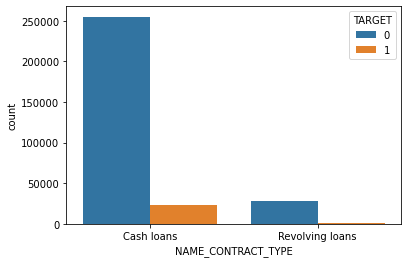

In [122]:
sns.countplot(data = app, x = 'NAME_CONTRACT_TYPE', hue = 'TARGET')

In [123]:
# Finding the percentage of defaulters and non deafulters:

pct_type_loan = app[['NAME_CONTRACT_TYPE', 'TARGET']].groupby(['NAME_CONTRACT_TYPE'], as_index = False).mean()

In [124]:
pct_type_loan

,NAME_CONTRACT_TYPE,TARGET
0,Cash loans,0.083459
1,Revolving loans,0.054783


In [125]:
pct_type_loan['PCT'] = pct_type_loan['TARGET']*100

In [126]:
pct_type_loan

,NAME_CONTRACT_TYPE,TARGET,PCT
0,Cash loans,0.083459,8.345913
1,Revolving loans,0.054783,5.478329


<AxesSubplot:xlabel='NAME_CONTRACT_TYPE', ylabel='PCT'>

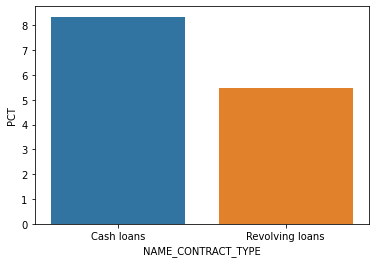

In [127]:
sns.barplot(data = pct_type_loan, x = 'NAME_CONTRACT_TYPE', y = 'PCT')

<AxesSubplot:xlabel='NAME_CONTRACT_TYPE', ylabel='PCT'>

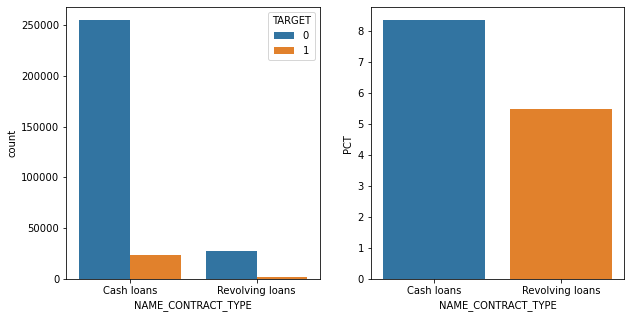

In [128]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1) # 1 row, 2 charts, 1st chart:
sns.countplot(data = app, x = 'NAME_CONTRACT_TYPE', hue = 'TARGET')

plt.subplot(1,2,2)# 1 row, 2 charts, 2nd chart:
sns.barplot(data = pct_type_loan, x = 'NAME_CONTRACT_TYPE', y = 'PCT')

**There are two types of loans given to the customers:**
1. Cash Loans: It is a type of personal loan which requires minimum documentation and the approval process is quick and speedy. According to the graph we can see that maximum of the customer (278232) took this type of loan. Out of 278232 customers, 250k customers are non defaulters however there are 1k customers who defaulted their loan.

2. Revolving Loans: It is a form of credit issued by a financial institution that provides the borrower with the ability to    draw down or withdraw, repay, and withdraw again. It is the least type of loan taken by the customer out of the two types of loans.


**Conclusion:**
Out of both types of loan, cash loans were the ones that were taken the most often. We can say that it is highly in demand compared to the other type.

Both the loan type consisted of defaulters, but cash loans have higher defaulters looking at the fact that it is the most demanded loan type.gah

In [129]:
ctg_app

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'ORGANIZATION_TYPE'],
      dtype='object')

### CODE_GENDER:

In [130]:
app['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [131]:
app['CODE_GENDER'] = app['CODE_GENDER'].map({'F' : 'Female', 'M' : 'Male', 'XNA' : 'NA'})

In [132]:
app['CODE_GENDER'].value_counts()

Female    202448
Male      105059
NA             4
Name: CODE_GENDER, dtype: int64

In [133]:
# Finding the percentage of Male and Female:

pct_gender = app[['CODE_GENDER', 'TARGET']].groupby(['CODE_GENDER'], as_index = False).mean()

In [134]:
pct_gender

,CODE_GENDER,TARGET
0,Female,0.069993
1,Male,0.101419
2,NA,0.000000


In [135]:
pct_gender['PCT'] = pct_gender['TARGET']*100

In [136]:
pct_gender

,CODE_GENDER,TARGET,PCT
0,Female,0.069993,6.999328
1,Male,0.101419,10.141920
2,NA,0.000000,0.000000


<AxesSubplot:xlabel='CODE_GENDER', ylabel='PCT'>

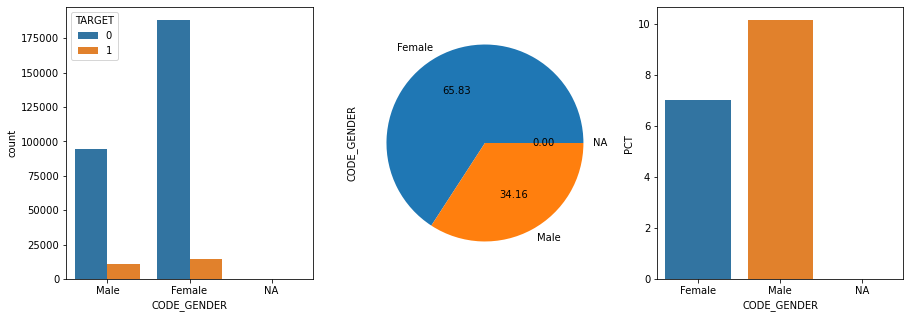

In [137]:
plt.figure(figsize = (15,5))

plt.subplot(1,3,1)
sns.countplot(data = app, x = 'CODE_GENDER', hue = 'TARGET')

plt.subplot(1,3,2)
app['CODE_GENDER'].value_counts().plot(kind = 'pie', autopct = '%.2f')

plt.subplot(1,3,3)
sns.barplot(data = pct_gender, x = 'CODE_GENDER', y = 'PCT')

**Conclusion:**

There are three categories in Code_Gender:
1. Male
2. Female
3. NA

* Out of 100% of the clients who took loan, 65.83% customers that took the loan were female. Male customers took 34.16% loan. 
* Females are also less likely to default compared to males.
* Male default rate is somehwere around 10% where female default rate is 7%.

In [138]:
ctg_app

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'ORGANIZATION_TYPE'],
      dtype='object')

### NAME_TYPE_SUITE:

In [139]:
app['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      249818
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

In [140]:
# Finding the percentage of Defaulters in the NAME_TYPE_SUITE:
pct_suite = app[['NAME_TYPE_SUITE', 'TARGET']].groupby(['NAME_TYPE_SUITE'], as_index = False).mean()
pct_suite

,NAME_TYPE_SUITE,TARGET
0,Children,0.073768
1,Family,0.074946
2,Group of people,0.084871
3,Other_A,0.087760
4,Other_B,0.098305
5,"Spouse, partner",0.078716
6,Unaccompanied,0.081687


In [141]:
pct_suite['PCT'] = pct_suite['TARGET']*100

In [142]:
pct_suite

,NAME_TYPE_SUITE,TARGET,PCT
0,Children,0.073768,7.376798
1,Family,0.074946,7.494583
2,Group of people,0.084871,8.487085
3,Other_A,0.087760,8.775982
4,Other_B,0.098305,9.830508
5,"Spouse, partner",0.078716,7.871592
6,Unaccompanied,0.081687,8.168747


<AxesSubplot:xlabel='NAME_TYPE_SUITE', ylabel='PCT'>

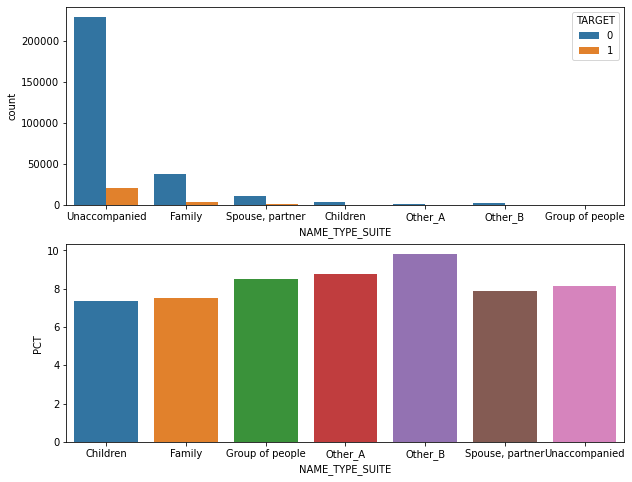

In [143]:
plt.figure(figsize = (10,8))

plt.subplot(2,1,1)
sns.countplot(data = app, x = 'NAME_TYPE_SUITE', hue = 'TARGET')

plt.subplot(2,1,2)
sns.barplot(data = pct_suite, x = 'NAME_TYPE_SUITE', y = 'PCT')

**Conclusion:**

There are 7 categories in the NAME_TYPE_SUITE feature:
1. Unaccompanied
2. Family
3. Spouse,partner
4. children
5. Other A
6. Other B
7. Group of people

* Most of the clients who came to apply for the loan were unaccompanied.
* Highest of the defaulters were accompanied by Other B.
* Customers accompanied with children appeared to be the safest out of all others. 
* Default rate is approx 8%

In [144]:
ctg_app

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'ORGANIZATION_TYPE'],
      dtype='object')

### NAME_INCOME_TYPE:

In [145]:
app['NAME_INCOME_TYPE'].value_counts()

Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

In [146]:
# Finding the percentage defaulters in NAME_INCOME_TYPE:

pct_income_type = app[['NAME_INCOME_TYPE', 'TARGET']].groupby(['NAME_INCOME_TYPE'], as_index = False).mean()
pct_income_type

,NAME_INCOME_TYPE,TARGET
0,Businessman,0.000000
1,Commercial associate,0.074843
2,Maternity leave,0.400000
3,Pensioner,0.053864
4,State servant,0.057550
5,Student,0.000000
6,Unemployed,0.363636
7,Working,0.095885


In [147]:
pct_income_type['PCT'] = pct_income_type['TARGET']*100
pct_income_type

,NAME_INCOME_TYPE,TARGET,PCT
0,Businessman,0.000000,0.000000
1,Commercial associate,0.074843,7.484257
2,Maternity leave,0.400000,40.000000
3,Pensioner,0.053864,5.386366
4,State servant,0.057550,5.754965
5,Student,0.000000,0.000000
6,Unemployed,0.363636,36.363636
7,Working,0.095885,9.588472


<AxesSubplot:xlabel='NAME_INCOME_TYPE', ylabel='PCT'>

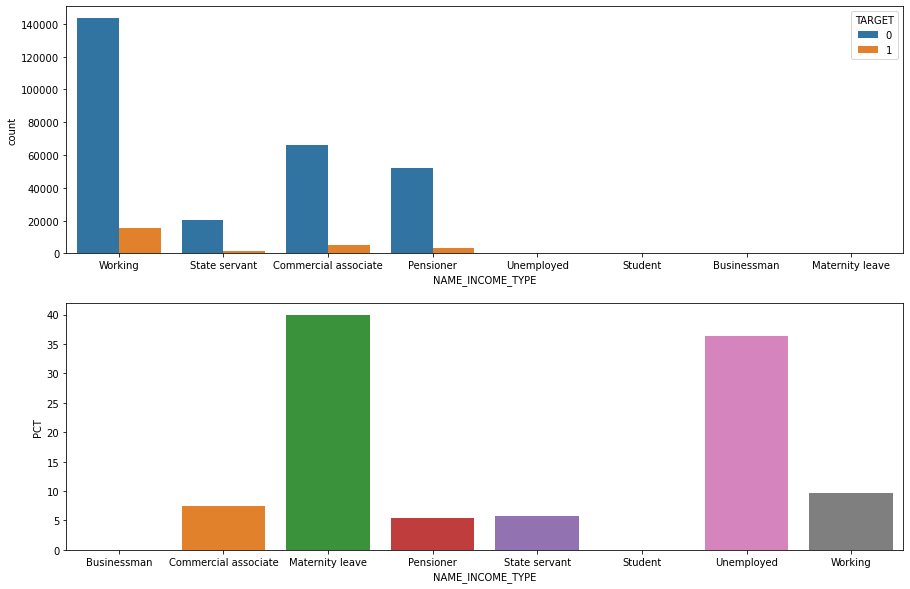

In [148]:
plt.figure(figsize = (15,10))

plt.subplot(2,1,1)
sns.countplot(data = app, x = 'NAME_INCOME_TYPE', hue = 'TARGET')

plt.subplot(2,1,2)
sns.barplot(data = pct_income_type, x = 'NAME_INCOME_TYPE', y = 'PCT')

**Conclusion:**

Categories in NAME_INCOME_TYPE feature are:
1. Businessman
2. Commercial associate
3. Maternity Leave
4. Pensioner
5. State Servant
6. Student
7. Unemploed
8. Working

* Out of all the categories, Working and Commercial Associate are the once that appeared maximum of the time to apply for the loan.
* Customers who's income type were ethither Maternity Leave or Unemployed were the highest of all other categories to be the loan defaulters.
* The safest segments are Commerical Associate, Pensioner and Working income type of customers as they were the least one to default their loans.

In [149]:
ctg_app

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'ORGANIZATION_TYPE'],
      dtype='object')

### NAME_EDUCATION_TYPE:

In [150]:
app['NAME_EDUCATION_TYPE'].value_counts()

Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64

In [151]:
# Percentage of defaulter in NAME_EDUCATION_TYPE:

pct_edu = app[['NAME_EDUCATION_TYPE', 'TARGET']].groupby(['NAME_EDUCATION_TYPE'], as_index = False).mean()
pct_edu

,NAME_EDUCATION_TYPE,TARGET
0,Academic degree,0.018293
1,Higher education,0.053551
2,Incomplete higher,0.084850
3,Lower secondary,0.109277
4,Secondary / secondary special,0.089399


In [152]:
pct_edu['PCT'] = pct_edu['TARGET']*100
pct_edu

,NAME_EDUCATION_TYPE,TARGET,PCT
0,Academic degree,0.018293,1.829268
1,Higher education,0.053551,5.355115
2,Incomplete higher,0.084850,8.484966
3,Lower secondary,0.109277,10.927673
4,Secondary / secondary special,0.089399,8.939929


<AxesSubplot:xlabel='NAME_EDUCATION_TYPE', ylabel='PCT'>

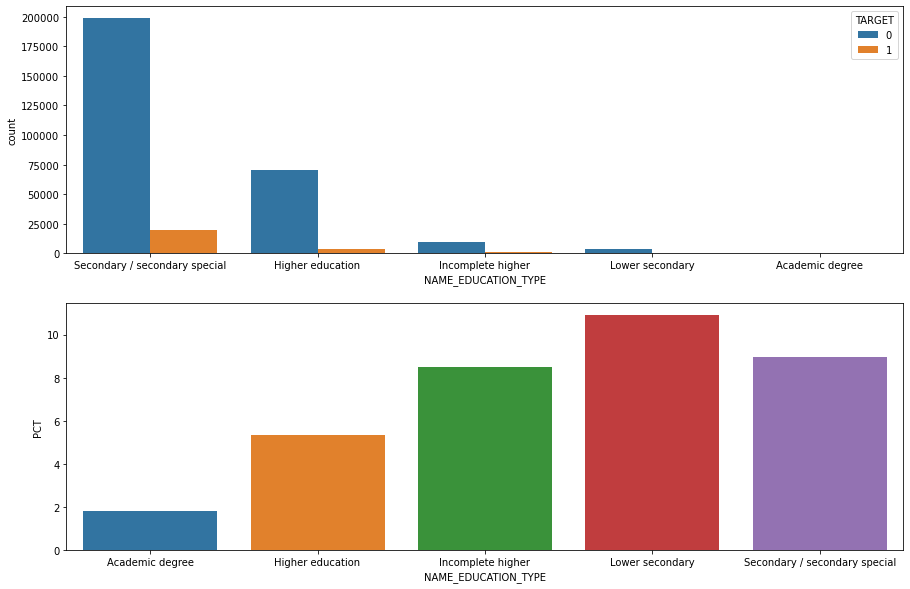

In [153]:
plt.figure(figsize = (15,10))

plt.subplot(2,1,1)
sns.countplot(data = app, x = 'NAME_EDUCATION_TYPE', hue = 'TARGET')

plt.subplot(2,1,2)
sns.barplot(data = pct_edu, x = 'NAME_EDUCATION_TYPE', y = 'PCT')

**Conclusion:**

There are 5 categories in this Feature:
1. Academic Degree
2. Higher Education
3. Incomplete Higher
4. Lower Secondary
5. Secondary / Secondary Special

* Secondary / Secondary Special appeared the highest to apply for the loan.
* Customers that has highest default on their loan belong from Lower Secondary, Secondary / Secondary Special and Incomplete Higher category of education.
* Most of the non-defaulter belong from Academic Degree and Higher Education. It is the safest way to avoid defaulting of loans.

In [154]:
ctg_app

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'ORGANIZATION_TYPE'],
      dtype='object')

### NAME_FAMILY_STATUS:

In [155]:
app['NAME_FAMILY_STATUS'].value_counts()

Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

In [156]:
# Percentage of defaulters in NAME_FAMILY_STATUS:

pct_fam = app[['NAME_FAMILY_STATUS', 'TARGET']].groupby(['NAME_FAMILY_STATUS'], as_index = False).mean()
pct_fam

,NAME_FAMILY_STATUS,TARGET
0,Civil marriage,0.099446
1,Married,0.075599
2,Separated,0.081942
3,Single / not married,0.098077
4,Unknown,0.000000
5,Widow,0.058242


In [157]:
pct_fam['PCT'] = pct_fam['TARGET']*100
pct_fam

,NAME_FAMILY_STATUS,TARGET,PCT
0,Civil marriage,0.099446,9.944584
1,Married,0.075599,7.559868
2,Separated,0.081942,8.194234
3,Single / not married,0.098077,9.807675
4,Unknown,0.000000,0.000000
5,Widow,0.058242,5.824217


<AxesSubplot:xlabel='NAME_FAMILY_STATUS', ylabel='PCT'>

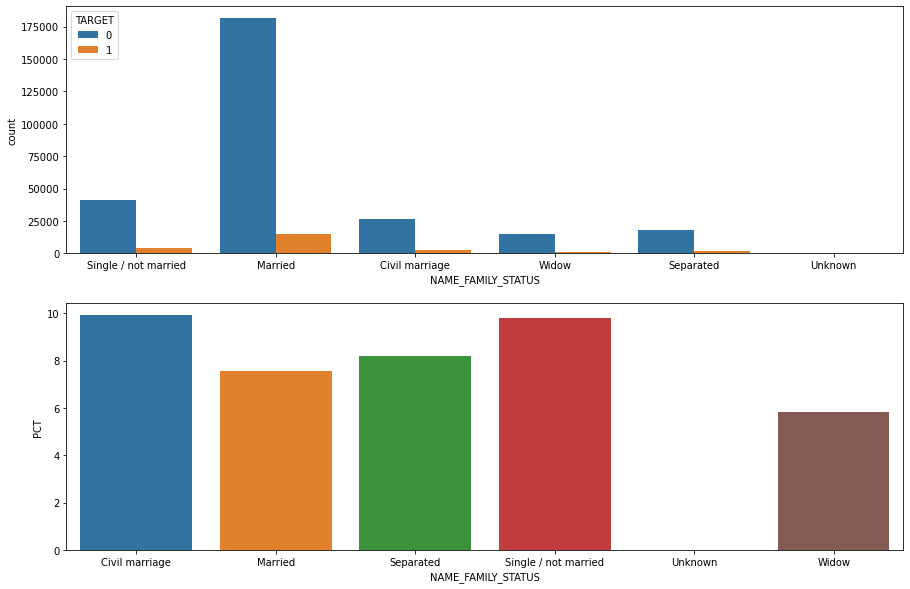

In [158]:
plt.figure(figsize = (15,10))

plt.subplot(2,1,1)
sns.countplot(data = app, x = 'NAME_FAMILY_STATUS', hue = 'TARGET')

plt.subplot(2,1,2)
sns.barplot(data = pct_fam, x = 'NAME_FAMILY_STATUS', y = 'PCT')

**Conclusion:**

There are 6 categories in this feature:
1. Civil Marriage
2. Married
3. Sperated
4. Single/not married
5. Widow
6. Unknown

* Customers who are married appeared the most to apply for the loan.
* Customers who belongs from Civil Marriage and Single/ not married cateogry of group are highest in terms of defaulter.
* It is safer to say that providing loan to Married, Seprated and Widow category of group is the safest way due to the maximum number of non-defaulters present in them out of other category.

In [159]:
ctg_app

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'ORGANIZATION_TYPE'],
      dtype='object')

### NAME_HOUSING_TYPE:

In [160]:
app['NAME_HOUSING_TYPE'].value_counts()

House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64

In [161]:
# Percentage of defaulters in this category:
pct_house = app[['NAME_HOUSING_TYPE', 'TARGET']].groupby(['NAME_HOUSING_TYPE'], as_index = False).mean()
pct_house

,NAME_HOUSING_TYPE,TARGET
0,Co-op apartment,0.079323
1,House / apartment,0.077957
2,Municipal apartment,0.085397
3,Office apartment,0.065724
4,Rented apartment,0.123131
5,With parents,0.116981


In [162]:
pct_house['PCT'] = pct_house['TARGET']*100
pct_house

,NAME_HOUSING_TYPE,TARGET,PCT
0,Co-op apartment,0.079323,7.932264
1,House / apartment,0.077957,7.795711
2,Municipal apartment,0.085397,8.539748
3,Office apartment,0.065724,6.572411
4,Rented apartment,0.123131,12.313051
5,With parents,0.116981,11.698113


<AxesSubplot:xlabel='NAME_HOUSING_TYPE', ylabel='PCT'>

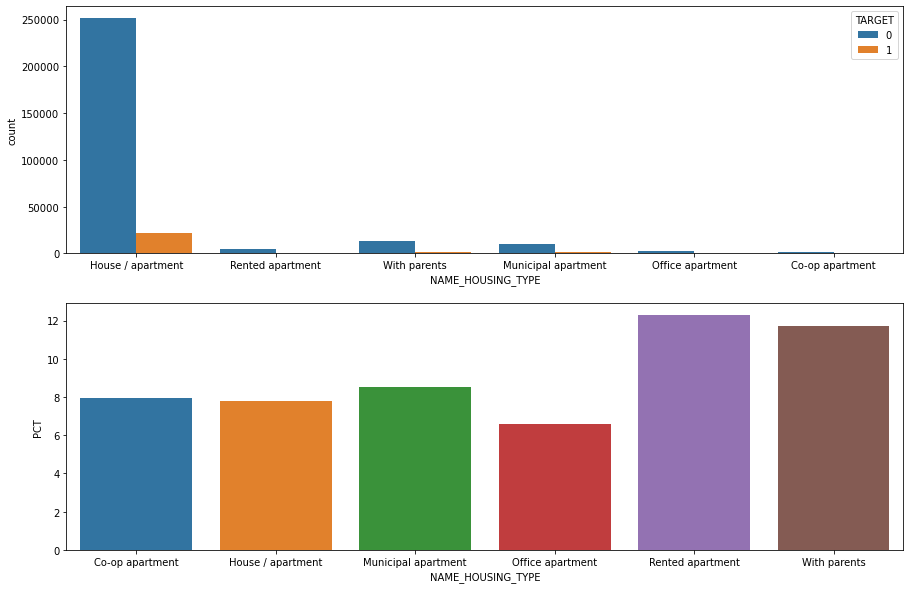

In [163]:
plt.figure(figsize = (15,10))

plt.subplot(2,1,1)
sns.countplot(data = app, x = 'NAME_HOUSING_TYPE', hue = 'TARGET')

plt.subplot(2,1,2)
sns.barplot(data = pct_house, x = 'NAME_HOUSING_TYPE', y = 'PCT')

**Conclusion:**

There are 6 Categories in this feature:
1. Co-op apartment
2. House/apartment
3. Municipal Apartment
4. Office apartment
5. Rented Apartment
6. With Parents

* Customer who have House/Apartment appeared more often to apply for the loan.
* Customers who falls under Rented Apartment or With parents category have defaulted their loan maximum.
* Giving loans to categories Co-op apartment, House/Apartment, Muinicipal Apartment and Office apartment is better option.
* The safest way is to maximize providing loan to customers who have Office Apartment as it has the least number of defaulters.

In [164]:
ctg_app

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'ORGANIZATION_TYPE'],
      dtype='object')

### OCCUPATION_TYPE:

In [165]:
app['OCCUPATION_TYPE'].value_counts()

Laborers                 151577
Sales staff               32102
Core staff                27570
Managers                  21371
Drivers                   18603
High skill tech staff     11380
Accountants                9813
Medicine staff             8537
Security staff             6721
Cooking staff              5946
Cleaning staff             4653
Private service staff      2652
Low-skill Laborers         2093
Waiters/barmen staff       1348
Secretaries                1305
Realty agents               751
HR staff                    563
IT staff                    526
Name: OCCUPATION_TYPE, dtype: int64

In [166]:
pct_occ = app[['OCCUPATION_TYPE', 'TARGET']].groupby(['OCCUPATION_TYPE'], as_index = False).mean()
pct_occ['PCT'] = pct_occ['TARGET']*100
pct_occ

,OCCUPATION_TYPE,TARGET,PCT
0,Accountants,0.048303,4.830327
1,Cleaning staff,0.096067,9.606705
2,Cooking staff,0.104440,10.443996
3,Core staff,0.063040,6.303954
4,Drivers,0.113261,11.326130
5,HR staff,0.063943,6.394316
6,High skill tech staff,0.061599,6.159930
7,IT staff,0.064639,6.463878
8,Laborers,0.079933,7.993297
9,Low-skill Laborers,0.171524,17.152413


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, 'Laborers'),
  Text(1, 0, 'Core staff'),
  Text(2, 0, 'Accountants'),
  Text(3, 0, 'Managers'),
  Text(4, 0, 'Drivers'),
  Text(5, 0, 'Sales staff'),
  Text(6, 0, 'Cleaning staff'),
  Text(7, 0, 'Cooking staff'),
  Text(8, 0, 'Private service staff'),
  Text(9, 0, 'Medicine staff'),
  Text(10, 0, 'Security staff'),
  Text(11, 0, 'High skill tech staff'),
  Text(12, 0, 'Waiters/barmen staff'),
  Text(13, 0, 'Low-skill Laborers'),
  Text(14, 0, 'Realty agents'),
  Text(15, 0, 'Secretaries'),
  Text(16, 0, 'IT staff'),
  Text(17, 0, 'HR staff')])

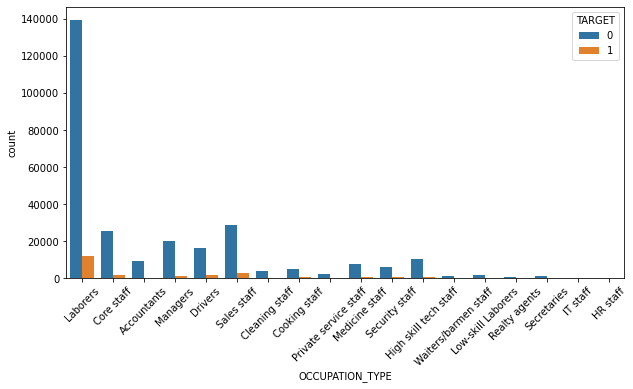

In [167]:
plt.figure(figsize = (10,5))
sns.countplot(data = app, x = 'OCCUPATION_TYPE', hue = 'TARGET')
plt.xticks(rotation = 45)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, 'Accountants'),
  Text(1, 0, 'Cleaning staff'),
  Text(2, 0, 'Cooking staff'),
  Text(3, 0, 'Core staff'),
  Text(4, 0, 'Drivers'),
  Text(5, 0, 'HR staff'),
  Text(6, 0, 'High skill tech staff'),
  Text(7, 0, 'IT staff'),
  Text(8, 0, 'Laborers'),
  Text(9, 0, 'Low-skill Laborers'),
  Text(10, 0, 'Managers'),
  Text(11, 0, 'Medicine staff'),
  Text(12, 0, 'Private service staff'),
  Text(13, 0, 'Realty agents'),
  Text(14, 0, 'Sales staff'),
  Text(15, 0, 'Secretaries'),
  Text(16, 0, 'Security staff'),
  Text(17, 0, 'Waiters/barmen staff')])

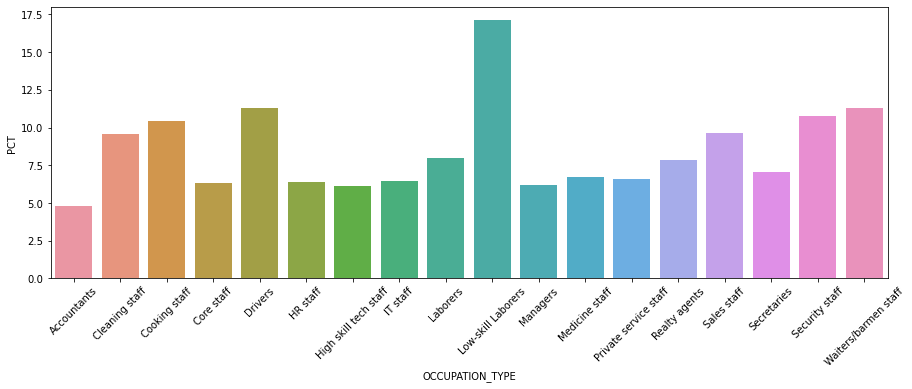

In [168]:
plt.figure(figsize = (15,5))

sns.barplot(data = pct_occ, x = 'OCCUPATION_TYPE', y = 'PCT')
plt.xticks(rotation = 45)

**Conclusion:**

* Labrores were the most appeared category out of every other category.
* Low skill labrores were the highest to deafult their loan.
* Avg rate = 10%
* It is safe to provide loans to the all other category except Low Labourers, Drivers, cooking staff, Security staff category.
* Lowest default rate were found in Accountant. 

In [169]:
ctg_app

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'ORGANIZATION_TYPE'],
      dtype='object')

### WEEKDAY_APPR_PROCESS_START:

In [170]:
app['ORGANIZATION_TYPE'].value_counts()

Business Entity Type 3    67992
XNA                       55374
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7           1307
Transpor

In [171]:
pct_org = app[['ORGANIZATION_TYPE', 'TARGET']].groupby(['ORGANIZATION_TYPE'], as_index = False).mean()
pct_org['PCT'] = pct_org['TARGET']*100
pct_org

,ORGANIZATION_TYPE,TARGET,PCT
0,Advertising,0.081585,8.158508
1,Agriculture,0.104727,10.472698
2,Bank,0.051855,5.185481
3,Business Entity Type 1,0.081384,8.138369
4,Business Entity Type 2,0.085284,8.528381
5,Business Entity Type 3,0.092996,9.299623
6,Cleaning,0.111538,11.153846
7,Construction,0.116798,11.679810
8,Culture,0.055409,5.540897
9,Electricity,0.066316,6.631579


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57]),
 [Text(0, 0, 'Business Entity Type 3'),
  Text(1, 0, 'School'),
  Text(2, 0, 'Government'),
  Text(3, 0, 'Religion'),
  Text(4, 0, 'Other'),
  Text(5, 0, 'XNA'),
  Text(6, 0, 'Electricity'),
  Text(7, 0, 'Medicine'),
  Text(8, 0, 'Business Entity Type 2'),
  Text(9, 0, 'Self-employed'),
  Text(10, 0, 'Transport: type 2'),
  Text(11, 0, 'Construction'),
  Text(12, 0, 'Housing'),
  Text(13, 0, 'Kindergarten'),
  Text(14, 0, 'Trade: type 7'),
  Text(15, 0, 'Industry: type 11'),
  Text(16, 0, 'Military'),
  Text(17, 0, 'Services'),
  Text(18, 0, 'Security Ministries'),
  Text(19, 0, 'Transport: type 4'),
  Text(20, 0, 'Industry: type 1'),
  Text(21, 0, 'Emergency'),
  Text(22, 0, 'Security'),
  Text(23, 0, 'Trade: type 2'),
  Te

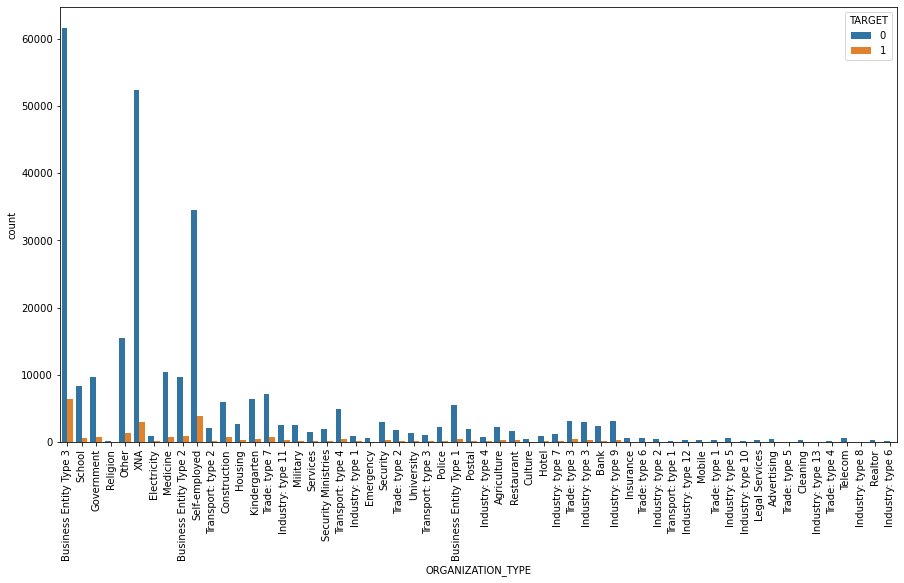

In [172]:
plt.figure(figsize = (15,8))
sns.countplot(data = app, x = 'ORGANIZATION_TYPE', hue = 'TARGET')
plt.xticks(rotation = 90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57]),
 [Text(0, 0, 'Trade: type 4'),
  Text(1, 0, 'Industry: type 12'),
  Text(2, 0, 'Transport: type 1'),
  Text(3, 0, 'Trade: type 6'),
  Text(4, 0, 'Security Ministries'),
  Text(5, 0, 'University'),
  Text(6, 0, 'Police'),
  Text(7, 0, 'Military'),
  Text(8, 0, 'Bank'),
  Text(9, 0, 'XNA'),
  Text(10, 0, 'Culture'),
  Text(11, 0, 'Insurance'),
  Text(12, 0, 'Religion'),
  Text(13, 0, 'School'),
  Text(14, 0, 'Trade: type 5'),
  Text(15, 0, 'Hotel'),
  Text(16, 0, 'Industry: type 10'),
  Text(17, 0, 'Medicine'),
  Text(18, 0, 'Services'),
  Text(19, 0, 'Electricity'),
  Text(20, 0, 'Industry: type 9'),
  Text(21, 0, 'Industry: type 5'),
  Text(22, 0, 'Government'),
  Text(23, 0, 'Trade: type 2'),
  Text(24, 0, 'Kindergarten'),


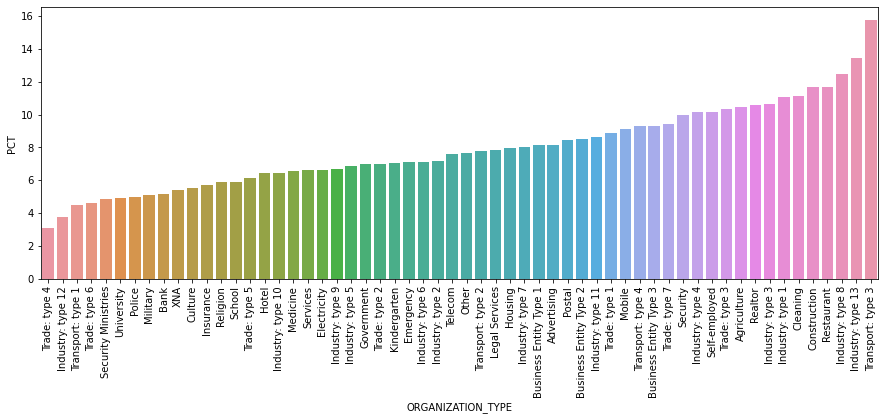

In [173]:
plt.figure(figsize = (15,5))

sns.barplot(data = pct_org, x = 'ORGANIZATION_TYPE', y = 'PCT', order = pct_org.sort_values('TARGET').ORGANIZATION_TYPE)
plt.xticks(rotation = 90)

**Conclusion:**

* Business Entity: Type 2 appeared the most for Loan
* Highest defaulters were found in Transport: type 3.
* Rate: 10.5% below those category every category is okay to be provided with loan.

# Univariate Analysis on Numerical Data:

In [174]:
app.dtypes.value_counts()

float64     18
int64       15
object      10
category     1
category     1
category     1
category     1
category     1
category     1
dtype: int64

In [175]:
# Creating a variable that will consist of all the qualitative data type column names:

num_app = app.select_dtypes(include = ['float64', 'int64']).columns

In [176]:
num_app

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

In [177]:
len(num_app)

33

There are 33 numeric variables.

In [178]:
num_data = app[num_app]

In [179]:
num_data.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,9461,637,3648.0,2120,1.0,2,2,10,0,0,0,0,0,0,2.0,2.0,2.0,2.0,1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,16765,1188,1186.0,291,2.0,1,1,11,0,0,0,0,0,0,1.0,0.0,1.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,19046,225,4260.0,2531,1.0,2,2,9,0,0,0,0,0,0,0.0,0.0,0.0,0.0,815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,19005,3039,9833.0,2437,2.0,2,2,17,0,0,0,0,0,0,2.0,0.0,2.0,0.0,617.0,0.0,0.0,0.0,0.0,0.0,1.0
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,19932,3038,4311.0,3458,1.0,2,2,11,0,0,0,0,1,1,0.0,0.0,0.0,0.0,1106.0,0.0,0.0,0.0,0.0,0.0,0.0


In [180]:
num_data.groupby(['TARGET']).size()/num_data.shape[0]*100

TARGET
0    91.927118
1     8.072882
dtype: float64

In [181]:
# Creating categories based on defaulters and non defaulters

defaulters_app = num_data[num_data['TARGET']==1]
repay_app = num_data[num_data['TARGET']==0]

In [182]:
defaulters_app.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,9461,637,3648.0,2120,1.0,2,2,10,0,0,0,0,0,0,2.0,2.0,2.0,2.0,1134.0,0.0,0.0,0.0,0.0,0.0,1.0
26,100031,1,0,112500.0,979992.0,27076.5,702000.0,0.018029,18724,2628,6573.0,1827,1.0,3,2,9,0,0,0,0,0,0,10.0,1.0,10.0,0.0,161.0,0.0,0.0,0.0,0.0,2.0,2.0
40,100047,1,0,202500.0,1193580.0,35028.0,855000.0,0.025164,17482,1262,1182.0,1029,2.0,2,2,9,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1075.0,0.0,0.0,0.0,2.0,0.0,4.0
42,100049,1,0,135000.0,288873.0,16258.5,238500.0,0.007305,13384,3597,45.0,4409,2.0,3,3,11,0,0,0,0,0,0,1.0,0.0,1.0,0.0,1480.0,0.0,0.0,0.0,0.0,0.0,2.0
81,100096,1,0,81000.0,252000.0,14593.5,252000.0,0.028663,24794,365243,5391.0,4199,2.0,2,2,10,0,0,0,0,0,0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [183]:
repay_app.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,16765,1188,1186.0,291,2.0,1,1,11,0,0,0,0,0,0,1.0,0.0,1.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,19046,225,4260.0,2531,1.0,2,2,9,0,0,0,0,0,0,0.0,0.0,0.0,0.0,815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,19005,3039,9833.0,2437,2.0,2,2,17,0,0,0,0,0,0,2.0,0.0,2.0,0.0,617.0,0.0,0.0,0.0,0.0,0.0,1.0
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,19932,3038,4311.0,3458,1.0,2,2,11,0,0,0,0,1,1,0.0,0.0,0.0,0.0,1106.0,0.0,0.0,0.0,0.0,0.0,0.0
5,100008,0,0,99000.0,490495.5,27517.5,454500.0,0.035792,16941,1588,4970.0,477,2.0,2,2,16,0,0,0,0,0,0,0.0,0.0,0.0,0.0,2536.0,0.0,0.0,0.0,0.0,1.0,1.0


## Creating Correlation for Defaulters:

In [184]:
defaulters_app.corr().head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,1.000000,NaN,-0.005144,-0.010165,-0.001290,-0.007578,-0.001814,0.006301,0.001254,-0.005161,-0.006342,0.002539,-0.003816,-0.005936,-0.004135,0.005004,-0.004249,0.004120,0.004303,0.008328,0.000787,-0.002929,-0.009395,-0.005549,-0.009058,-0.009428,-0.002455,-0.011106,-0.007388,-0.003075,0.005180,-0.001614,0.006843
TARGET,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNT_CHILDREN,-0.005144,NaN,1.000000,0.004796,-0.001675,0.031257,-0.008111,-0.031975,-0.259109,-0.192864,-0.149154,0.032299,0.885484,0.040680,0.043185,-0.023899,-0.024322,-0.020793,-0.012073,-0.001174,0.046115,0.053515,0.025804,0.001448,0.025180,-0.005106,-0.011547,0.000316,-0.011255,-0.009316,-0.008852,-0.013029,-0.027253
AMT_INCOME_TOTAL,-0.010165,NaN,0.004796,1.000000,0.038131,0.046421,0.037591,0.009135,-0.003096,-0.014977,-0.000158,0.004215,0.006654,-0.021486,-0.022808,0.013775,0.007577,0.014531,0.013409,-0.002223,-0.003019,-0.001353,-0.004709,-0.005186,-0.004616,-0.004866,0.002429,0.001079,0.000135,0.000941,0.005718,0.001037,0.004516
AMT_CREDIT,-0.001290,NaN,-0.001675,0.038131,1.000000,0.752195,0.982783,0.069161,0.135316,0.001930,0.025854,0.052329,0.051224,-0.059193,-0.071377,0.031782,0.019540,0.033260,0.033554,-0.033034,-0.037720,-0.016509,0.019098,-0.025979,0.019487,-0.030880,0.110851,-0.003771,0.004346,0.010598,0.056227,-0.007201,-0.020698


Target variable is not much of a use. We will drop it.

In [185]:
defaulters_app = defaulters_app.drop('TARGET', axis = 1)

In [186]:
defaulter_corr = defaulters_app.corr()

**Created defaulter correlation**

### AMT univariate analysis:

In [187]:
defaulters_app[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']].corr()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE
AMT_INCOME_TOTAL,1.000000,0.038131,0.046421,0.037591
AMT_CREDIT,0.038131,1.000000,0.752195,0.982783
AMT_ANNUITY,0.046421,0.752195,1.000000,0.752295
AMT_GOODS_PRICE,0.037591,0.982783,0.752295,1.000000


These are highly correlated with each other.

In [188]:
amt_app = ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']

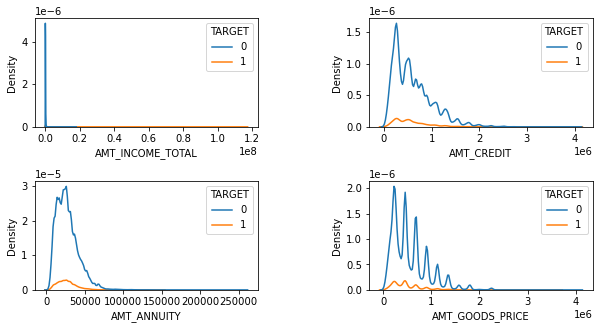

In [189]:
plt.figure(figsize = (10,5))

plt.subplot(2,2,1)
sns.kdeplot(data = num_data, x = 'AMT_INCOME_TOTAL', hue = 'TARGET')
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

plt.subplot(2,2,2)
sns.kdeplot(data = num_data, x = 'AMT_CREDIT', hue = 'TARGET')
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

plt.subplot(2,2,3)
sns.kdeplot(data = num_data, x = 'AMT_ANNUITY', hue = 'TARGET')
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

plt.subplot(2,2,4)
sns.kdeplot(data = num_data, x = 'AMT_GOODS_PRICE', hue = 'TARGET')
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

**Conclusion:**


AMT_INCOME_TOTAL: Income of the customer

* Most of the customers who were given the loan had a income between 0 to 100k.
* 1e8 = 1 * 10^8
* Most of the customer who took the loan and turn out to be non deaulter had total income between 0 to 1 million.

AMT_CREDIT: Credit amount of the loan

* Loan that was given on credit ranged between 0 to 1 million

AMT_ANNUITY: Loan annuity/ amount that customer have to give to the bank in the form of installments.

* Annuity ranged between 0 to 50k.

AMT_GOODS_PRICE: Price of the goods for which the loan was given.

* Most of the goods ranged between 0 to 1 million.

Goods price and credit given to the customer may form a relationship as the good price for consumer will affect the loan amount they applied for.


## Bivariate Analysis:

<AxesSubplot:xlabel='AMT_CREDIT', ylabel='AMT_GOODS_PRICE'>

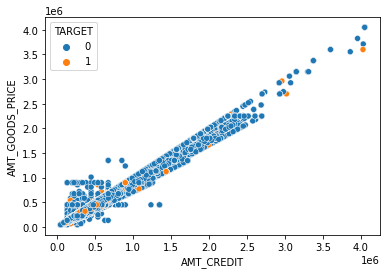

In [190]:
sns.scatterplot(data = num_data, x = 'AMT_CREDIT', y = 'AMT_GOODS_PRICE', hue = 'TARGET')

**Conclucion**

* We have a perfect linear correlation meaning that if the customer's goods price is higher, the amount of loan they will apply for will also be in proportionate.

* AMT_GOODS_PRICE increase, AMT_CREDIT also Increases.

* When the amount of credit increases, defaulter rate dicreases.

<AxesSubplot:xlabel='AMT_CREDIT', ylabel='AMT_INCOME_TOTAL'>

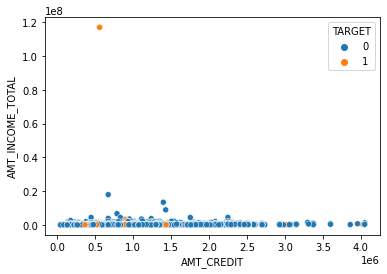

In [191]:
sns.scatterplot(data = num_data, x = 'AMT_CREDIT', y = 'AMT_INCOME_TOTAL', hue = 'TARGET')

**Conclusion**

* When the income is more than a million, less of the loan is been taken.
* The people who are earning less than a million and taking a loan of less than 1.5, there are possibilities that they will turn out to be defaulters.

<AxesSubplot:xlabel='AMT_CREDIT', ylabel='CNT_CHILDREN'>

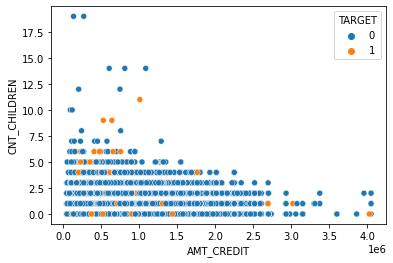

In [192]:
sns.scatterplot(data = num_data, x = 'AMT_CREDIT', y = 'CNT_CHILDREN', hue = 'TARGET')

**Conclusion**

* Customers with no children tend to be more responsible for loan defaulting.
* Customers who have count of children from 1 to 4 tend to have least deafulted their loans.
* Customers who have no children and applied for loan of more than 1.5 million are safe to be provided with loan as they will less likely to default their loan.

<AxesSubplot:xlabel='AMT_CREDIT', ylabel='AMT_ANNUITY'>

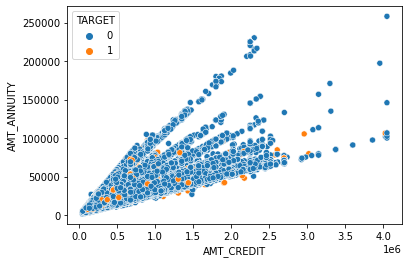

In [193]:
sns.scatterplot(data = num_data, x = 'AMT_CREDIT', y = 'AMT_ANNUITY', hue = 'TARGET')

**Conclusion**

* It occurs that customers who can pay annuity of more than 0 and till 100,000 are more likely gonna apply for the loan amount of 1M50K.

* Customers with less than 50,000 aunnuity and credit of more than 1 million are more likely to default their loan.

In [194]:
#  Pair plot of amt:

amt_pair = num_data[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'TARGET']]

In [195]:
# sns.pairplot(data = amt_pair, hue = 'TARGET')

# Feature Engineering and Merging the Table 'Previous Application':

In [197]:
prev_df = pd.read_csv(r'Z:\My Work\To Upload on GITHUB\EDA Projects\Loan Defaulter\previous_application.csv')

In [198]:
prev_null = pd.DataFrame(prev_df.isnull().sum().sort_values(ascending = False)/prev_df.shape[0]*100).reset_index().rename(columns = {'index' : 'Variable',
                                                                                                                                    0 : 'PCT'})

In [199]:
prev_null

,Variable,PCT
0,RATE_INTEREST_PRIVILEGED,99.643698
1,RATE_INTEREST_PRIMARY,99.643698
2,AMT_DOWN_PAYMENT,53.636480
3,RATE_DOWN_PAYMENT,53.636480
4,NAME_TYPE_SUITE,49.119754
5,NFLAG_INSURED_ON_APPROVAL,40.298129
6,DAYS_TERMINATION,40.298129
7,DAYS_LAST_DUE,40.298129
8,DAYS_LAST_DUE_1ST_VERSION,40.298129
9,DAYS_FIRST_DUE,40.298129


In [200]:
msng_prev_40 = list(prev_null[prev_null['PCT'] >= 40]['Variable'])

In [201]:
len(msng_prev_40)

11

Let's Check anymore variables that will not be needed in analysis

In [202]:
prev_df.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


Non-useful feature.

* WEEKDAY_APPR_PROCESS_START will not be of much use in analysis as it contains the week day name on which the customer applied for the loan.

* HOUR_APPR_PROCESS_START shows that at which point of hour client applied for the loan.

* FLAG_LAST_APPL_PER_CONTRACT shows that if the customer applied for the same contract (Y/N)

* NFLAG_LAST_APPL_IN_DAY shows the count of FLAG_LAST_APPL_PER_CONTRACT if Y.

In [203]:
droped_prev_feature = msng_prev_40 + ['WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT'
                                     , 'NFLAG_LAST_APPL_IN_DAY']

In [204]:
len(droped_prev_feature)

15

In [205]:
prev_app = prev_df.drop(labels = droped_prev_feature, axis = 1)

In [206]:
prev_app.shape

(1670214, 22)

In [207]:
prev_app.isnull().sum().sort_values()

SK_ID_PREV                     0
NAME_SELLER_INDUSTRY           0
SELLERPLACE_AREA               0
CHANNEL_TYPE                   0
NAME_PRODUCT_TYPE              0
NAME_PORTFOLIO                 0
NAME_GOODS_CATEGORY            0
NAME_CLIENT_TYPE               0
CODE_REJECT_REASON             0
NAME_YIELD_GROUP               0
NAME_PAYMENT_TYPE              0
NAME_CONTRACT_STATUS           0
NAME_CASH_LOAN_PURPOSE         0
AMT_APPLICATION                0
NAME_CONTRACT_TYPE             0
SK_ID_CURR                     0
DAYS_DECISION                  0
AMT_CREDIT                     1
PRODUCT_COMBINATION          346
CNT_PAYMENT               372230
AMT_ANNUITY               372235
AMT_GOODS_PRICE           385515
dtype: int64

In [208]:
prev_app.isnull().sum().sort_values()/prev_app.shape[0]*100

SK_ID_PREV                 0.000000
NAME_SELLER_INDUSTRY       0.000000
SELLERPLACE_AREA           0.000000
CHANNEL_TYPE               0.000000
NAME_PRODUCT_TYPE          0.000000
NAME_PORTFOLIO             0.000000
NAME_GOODS_CATEGORY        0.000000
NAME_CLIENT_TYPE           0.000000
CODE_REJECT_REASON         0.000000
NAME_YIELD_GROUP           0.000000
NAME_PAYMENT_TYPE          0.000000
NAME_CONTRACT_STATUS       0.000000
NAME_CASH_LOAN_PURPOSE     0.000000
AMT_APPLICATION            0.000000
NAME_CONTRACT_TYPE         0.000000
SK_ID_CURR                 0.000000
DAYS_DECISION              0.000000
AMT_CREDIT                 0.000060
PRODUCT_COMBINATION        0.020716
CNT_PAYMENT               22.286366
AMT_ANNUITY               22.286665
AMT_GOODS_PRICE           23.081773
dtype: float64

In [209]:
# CNT_PAYMENT:

prev_app['CNT_PAYMENT'].value_counts()

12.0    323049
6.0     190461
0.0     144985
10.0    141851
24.0    137764
18.0     77430
36.0     72583
60.0     53600
48.0     47316
8.0      30349
4.0      26924
30.0     16924
14.0      8253
42.0      7136
16.0      5710
5.0       3957
54.0      2104
20.0      1805
7.0       1434
9.0       1236
3.0       1100
15.0       904
11.0       669
72.0       139
13.0        51
17.0        48
84.0        45
22.0        37
23.0        27
26.0        13
35.0        11
66.0        10
28.0         8
29.0         8
32.0         6
19.0         6
34.0         4
59.0         4
41.0         3
47.0         3
45.0         3
21.0         3
44.0         2
39.0         2
46.0         2
38.0         2
33.0         1
40.0         1
53.0         1
Name: CNT_PAYMENT, dtype: int64

In [210]:
prev_app['CNT_PAYMENT'].agg(func = ['min', 'max', 'median', 'mean'])

min        0.000000
max       84.000000
median    12.000000
mean      16.054082
Name: CNT_PAYMENT, dtype: float64

In [211]:
prev_app['CNT_PAYMENT'] =  prev_app['CNT_PAYMENT'].fillna(0)

In [212]:
prev_app['CNT_PAYMENT'].isnull().sum()

0

In [213]:
prev_app.isnull().sum().sort_values()/prev_app.shape[0]*100

SK_ID_PREV                 0.000000
CNT_PAYMENT                0.000000
NAME_SELLER_INDUSTRY       0.000000
SELLERPLACE_AREA           0.000000
CHANNEL_TYPE               0.000000
NAME_PRODUCT_TYPE          0.000000
NAME_PORTFOLIO             0.000000
NAME_GOODS_CATEGORY        0.000000
NAME_CLIENT_TYPE           0.000000
CODE_REJECT_REASON         0.000000
NAME_PAYMENT_TYPE          0.000000
DAYS_DECISION              0.000000
NAME_CONTRACT_STATUS       0.000000
NAME_CASH_LOAN_PURPOSE     0.000000
AMT_APPLICATION            0.000000
NAME_CONTRACT_TYPE         0.000000
SK_ID_CURR                 0.000000
NAME_YIELD_GROUP           0.000000
AMT_CREDIT                 0.000060
PRODUCT_COMBINATION        0.020716
AMT_ANNUITY               22.286665
AMT_GOODS_PRICE           23.081773
dtype: float64

In [214]:
# AMT_ANNUITY:

prev_app['AMT_ANNUITY'].value_counts()

2250.000      31865
11250.000     13974
6750.000      13442
9000.000      12496
22500.000     11903
4500.000      10597
13500.000      7171
3375.000       4806
7875.000       4674
38250.000      4129
5625.000       3993
45000.000      3604
10125.000      2558
16875.000      2436
18000.000      1861
29250.000      1662
0.000          1637
12375.000      1634
20250.000      1621
33750.000      1412
15750.000      1370
27000.000      1075
14625.000       864
10492.020       841
36000.000       816
27449.820       731
21709.125       728
5246.010        665
7869.015        653
19151.100       639
25996.365       568
14746.455       564
19125.000       544
24172.650       537
39474.000       532
9830.970        529
9842.400        519
11386.170       514
17079.255       501
40783.995       499
15737.985       496
21375.000       494
24750.000       488
8981.820        486
9426.240        481
52788.780       481
18235.080       470
28465.380       461
20123.865       452
10849.860       447


In [215]:
prev_app['AMT_ANNUITY'].agg(func = ['mean', 'median', 'min', 'max'])

mean       15955.120659
median     11250.000000
min            0.000000
max       418058.145000
Name: AMT_ANNUITY, dtype: float64

In [216]:
AMT_ANNUITY_Mean = prev_app['AMT_ANNUITY'].fillna(prev_app['AMT_ANNUITY'].mean())
AMT_ANNUITY_Median = prev_app['AMT_ANNUITY'].fillna(prev_app['AMT_ANNUITY'].median())
AMT_ANNUITY_Mode = prev_app['AMT_ANNUITY'].fillna(prev_app['AMT_ANNUITY'].mode())

<AxesSubplot:xlabel='AMT_ANNUITY', ylabel='Density'>

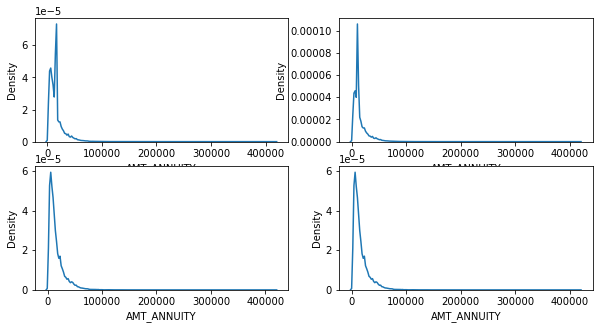

In [217]:
plt.figure(figsize = (10,5))

plt.subplot(2,2,1)
sns.kdeplot(data = prev_app, x = AMT_ANNUITY_Mean)

plt.subplot(2,2,2)
sns.kdeplot(data = prev_app, x = AMT_ANNUITY_Median)

plt.subplot(2,2,3)
sns.kdeplot(data = prev_app, x = AMT_ANNUITY_Mode)

plt.subplot(2,2,4)
sns.kdeplot(data = prev_app, x = 'AMT_ANNUITY')

In [218]:
# Filling null values:

prev_app['AMT_ANNUITY'] = prev_app['AMT_ANNUITY'].fillna(prev_app['AMT_ANNUITY'].median())

In [219]:
prev_app['AMT_ANNUITY'].isnull().sum()

0

In [220]:
prev_app.isnull().sum().sort_values()/prev_app.shape[0]*100

SK_ID_PREV                 0.000000
CNT_PAYMENT                0.000000
NAME_SELLER_INDUSTRY       0.000000
SELLERPLACE_AREA           0.000000
CHANNEL_TYPE               0.000000
NAME_PRODUCT_TYPE          0.000000
NAME_PORTFOLIO             0.000000
NAME_GOODS_CATEGORY        0.000000
NAME_CLIENT_TYPE           0.000000
CODE_REJECT_REASON         0.000000
NAME_PAYMENT_TYPE          0.000000
DAYS_DECISION              0.000000
NAME_CONTRACT_STATUS       0.000000
NAME_CASH_LOAN_PURPOSE     0.000000
AMT_APPLICATION            0.000000
AMT_ANNUITY                0.000000
NAME_CONTRACT_TYPE         0.000000
SK_ID_CURR                 0.000000
NAME_YIELD_GROUP           0.000000
AMT_CREDIT                 0.000060
PRODUCT_COMBINATION        0.020716
AMT_GOODS_PRICE           23.081773
dtype: float64

In [221]:
# AMT_GOODS_PRICE handling missing values:

prev_app['AMT_GOODS_PRICE'].value_counts()

45000.000      47831
225000.000     43549
135000.000     40666
450000.000     38926
90000.000      29367
180000.000     24736
270000.000     20567
675000.000     20235
67500.000      16857
900000.000     15572
112500.000     14373
315000.000     11920
229500.000     10756
337500.000     10537
360000.000     10286
157500.000     10220
1350000.000     8434
202500.000      7937
247500.000      7161
454500.000      7039
1129500.000     6928
0.000           6869
540000.000      6842
1125000.000     6390
405000.000      5872
765000.000      5124
585000.000      4770
292500.000      3787
495000.000      3749
810000.000      3487
630000.000      2872
720000.000      2757
31455.000       2569
22455.000       2545
1800000.000     2531
382500.000      2481
44955.000       2350
26955.000       2333
472500.000      2301
184500.000      2225
62955.000       2224
35955.000       2219
1354500.000     2159
679500.000      2130
2250000.000     2032
1215000.000     2026
40455.000       1970
238500.000   

In [222]:
prev_app['AMT_GOODS_PRICE'].describe()

count    1.284699e+06
mean     2.278473e+05
std      3.153966e+05
min      0.000000e+00
25%      5.084100e+04
50%      1.123200e+05
75%      2.340000e+05
max      6.905160e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [223]:
prev_app['AMT_GOODS_PRICE'].agg(func = ['mean', 'median'])

mean      227847.279283
median    112320.000000
Name: AMT_GOODS_PRICE, dtype: float64

In [224]:
AMT_GOODS_PRICE_Mean = prev_app['AMT_GOODS_PRICE'].fillna(prev_app['AMT_GOODS_PRICE'].mean())
AMT_GOODS_PRICE_Median = prev_app['AMT_GOODS_PRICE'].fillna(prev_app['AMT_GOODS_PRICE'].median())
AMT_GOODS_PRICE_Mode = prev_app['AMT_GOODS_PRICE'].fillna(prev_app['AMT_GOODS_PRICE'].mode())

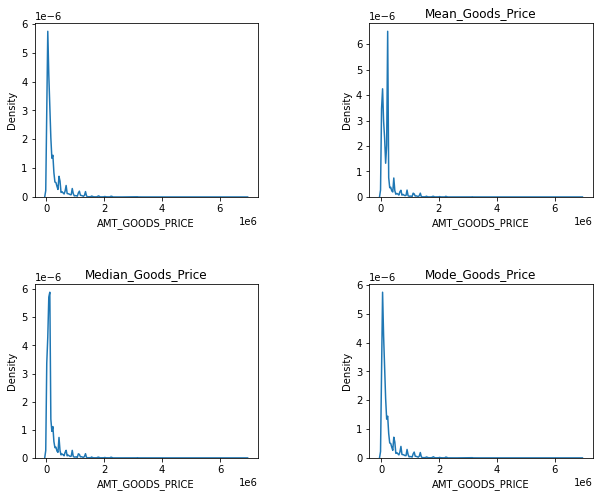

In [225]:
plt.figure(figsize = (10,8))

plt.subplot(2,2,1)
sns.kdeplot(data = prev_app, x = 'AMT_GOODS_PRICE')
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

plt.subplot(2,2,2)
sns.kdeplot(data = prev_app, x = AMT_GOODS_PRICE_Mean).set(title = "Mean_Goods_Price")
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

plt.subplot(2,2,3)
sns.kdeplot(data = prev_app, x = AMT_GOODS_PRICE_Median).set(title = "Median_Goods_Price")
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

plt.subplot(2,2,4)
sns.kdeplot(data = prev_app, x = AMT_GOODS_PRICE_Mode).set(title = "Mode_Goods_Price")
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

In [226]:
prev_app['AMT_GOODS_PRICE'] = prev_app['AMT_GOODS_PRICE'].fillna(prev_app['AMT_GOODS_PRICE'].median())

In [227]:
prev_app['AMT_GOODS_PRICE'].isnull().sum()

0

In [228]:
prev_app.isnull().sum().sort_values()/prev_app.shape[0]*100

SK_ID_PREV                0.000000
CNT_PAYMENT               0.000000
NAME_SELLER_INDUSTRY      0.000000
SELLERPLACE_AREA          0.000000
CHANNEL_TYPE              0.000000
NAME_PRODUCT_TYPE         0.000000
NAME_PORTFOLIO            0.000000
NAME_GOODS_CATEGORY       0.000000
NAME_CLIENT_TYPE          0.000000
CODE_REJECT_REASON        0.000000
NAME_PAYMENT_TYPE         0.000000
DAYS_DECISION             0.000000
NAME_CONTRACT_STATUS      0.000000
NAME_CASH_LOAN_PURPOSE    0.000000
AMT_GOODS_PRICE           0.000000
AMT_APPLICATION           0.000000
AMT_ANNUITY               0.000000
NAME_CONTRACT_TYPE        0.000000
SK_ID_CURR                0.000000
NAME_YIELD_GROUP          0.000000
AMT_CREDIT                0.000060
PRODUCT_COMBINATION       0.020716
dtype: float64

In [229]:
# Filling Null values in PRODUCT_COMBINATION:

prev_app['PRODUCT_COMBINATION'].value_counts()

Cash                              285990
POS household with interest       263622
POS mobile with interest          220670
Cash X-Sell: middle               143883
Cash X-Sell: low                  130248
Card Street                       112582
POS industry with interest         98833
POS household without interest     82908
Card X-Sell                        80582
Cash Street: high                  59639
Cash X-Sell: high                  59301
Cash Street: middle                34658
Cash Street: low                   33834
POS mobile without interest        24082
POS other with interest            23879
POS industry without interest      12602
POS others without interest         2555
Name: PRODUCT_COMBINATION, dtype: int64

In [230]:
prev_app['PRODUCT_COMBINATION'].isnull().sum()

346

In [231]:
prev_app['PRODUCT_COMBINATION'].mode()[0]

'Cash'

In [232]:
prev_app['PRODUCT_COMBINATION'] = prev_app['PRODUCT_COMBINATION'].fillna(prev_app['PRODUCT_COMBINATION'].mode()[0])

In [233]:
prev_app['PRODUCT_COMBINATION'].isnull().sum()

0

In [234]:
prev_app.isnull().sum()

SK_ID_PREV                0
SK_ID_CURR                0
NAME_CONTRACT_TYPE        0
AMT_ANNUITY               0
AMT_APPLICATION           0
AMT_CREDIT                1
AMT_GOODS_PRICE           0
NAME_CASH_LOAN_PURPOSE    0
NAME_CONTRACT_STATUS      0
DAYS_DECISION             0
NAME_PAYMENT_TYPE         0
CODE_REJECT_REASON        0
NAME_CLIENT_TYPE          0
NAME_GOODS_CATEGORY       0
NAME_PORTFOLIO            0
NAME_PRODUCT_TYPE         0
CHANNEL_TYPE              0
SELLERPLACE_AREA          0
NAME_SELLER_INDUSTRY      0
CNT_PAYMENT               0
NAME_YIELD_GROUP          0
PRODUCT_COMBINATION       0
dtype: int64

In [235]:
prev_app['AMT_CREDIT'].isnull().sum()

1

In [236]:
prev_app['AMT_CREDIT'].describe()

count    1.670213e+06
mean     1.961140e+05
std      3.185746e+05
min      0.000000e+00
25%      2.416050e+04
50%      8.054100e+04
75%      2.164185e+05
max      6.905160e+06
Name: AMT_CREDIT, dtype: float64

In [237]:
prev_app['AMT_CREDIT'].agg(func = ['mean', 'median'])

mean      196114.021218
median     80541.000000
Name: AMT_CREDIT, dtype: float64

In [238]:
prev_app['AMT_CREDIT'] = prev_app['AMT_CREDIT'].fillna(prev_app['AMT_CREDIT'].median())

In [239]:
prev_app.isnull().sum()/prev_app.shape[0]*100

SK_ID_PREV                0.0
SK_ID_CURR                0.0
NAME_CONTRACT_TYPE        0.0
AMT_ANNUITY               0.0
AMT_APPLICATION           0.0
AMT_CREDIT                0.0
AMT_GOODS_PRICE           0.0
NAME_CASH_LOAN_PURPOSE    0.0
NAME_CONTRACT_STATUS      0.0
DAYS_DECISION             0.0
NAME_PAYMENT_TYPE         0.0
CODE_REJECT_REASON        0.0
NAME_CLIENT_TYPE          0.0
NAME_GOODS_CATEGORY       0.0
NAME_PORTFOLIO            0.0
NAME_PRODUCT_TYPE         0.0
CHANNEL_TYPE              0.0
SELLERPLACE_AREA          0.0
NAME_SELLER_INDUSTRY      0.0
CNT_PAYMENT               0.0
NAME_YIELD_GROUP          0.0
PRODUCT_COMBINATION       0.0
dtype: float64

# Merging Both Dataset:

In [242]:
prev_app.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [244]:
merged_df = pd.merge(left = app, right = prev_app, how = 'inner', on = 'SK_ID_CURR')

In [245]:
merged_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_GOODS_PRICE_RANGE,AMT_INCOME_TOTAL_RANGE,AMT_CREDIT_RANGE,AMT_ANNUITY_RANGE,DAYS_EMPLOYED_RANGE,DAYS_BIRTH_RANGE,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,Male,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,2.0,2.0,2.0,2.0,1134.0,0.0,0.0,0.0,0.0,0.0,1.0,300k - 400k,200k - 250k,400k - 500k,20k - 30k,0 - 5Y,20Y - 30Y,1038818,Consumer loans,9251.775,179055.0,179055.0,179055.0,XAP,Approved,-606,XNA,XAP,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest
1,100003,0,Cash loans,Female,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0,Above 900k,250k - 300k,Above 1M,30k - 40k,0 - 5Y,40Y - 50Y,1810518,Cash loans,98356.995,900000.0,1035882.0,900000.0,XNA,Approved,-746,XNA,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,Female,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0,Above 900k,250k - 300k,Above 1M,30k - 40k,0 - 5Y,40Y - 50Y,2636178,Consumer loans,64567.665,337500.0,348637.5,337500.0,XAP,Approved,-828,Cash through the bank,XAP,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest
3,100003,0,Cash loans,Female,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0,Above 900k,250k - 300k,Above 1M,30k - 40k,0 - 5Y,40Y - 50Y,2396755,Consumer loans,6737.310,68809.5,68053.5,68809.5,XAP,Approved,-2341,Cash through the bank,XAP,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.0,middle,POS household with interest
4,100004,0,Revolving loans,Male,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046,225,4260.0,2531,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.0,0.0,0.0,0.0,815.0,0.0,0.0,0.0,0.0,0.0,0.0,100k - 200k,50k - 100k,0 - 200k,0 - 10k,0 - 5Y,50Y - 60Y,1564014,Consumer loans,5357.250,24282.0,20106.0,24282.0,XAP,Approved,-815,Cash through the bank,XAP,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.0,middle,POS mobile without interest


# Performing Analysis on Merged DataFrame:

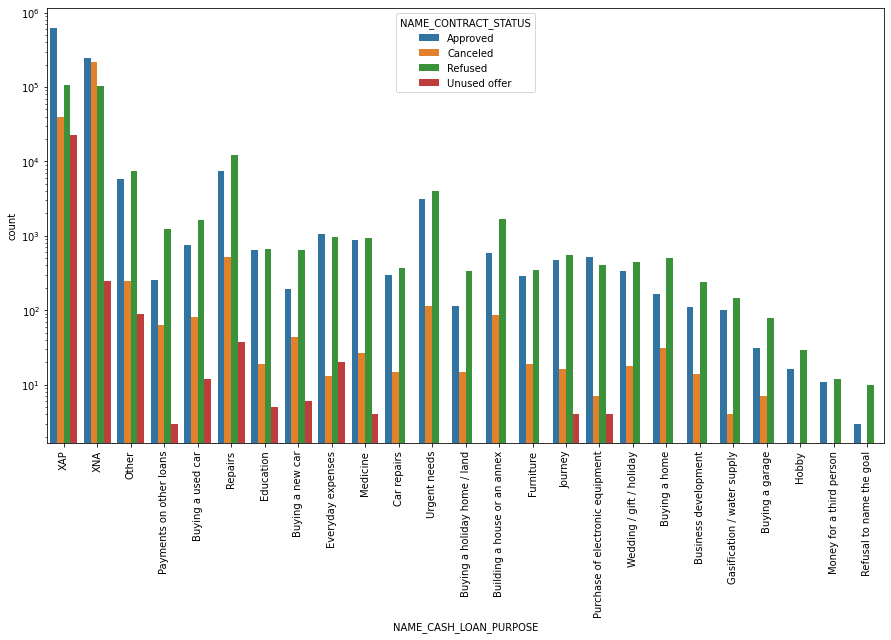

In [248]:
plt.figure(figsize = (15,8))

sns.countplot(data = merged_df, x = 'NAME_CASH_LOAN_PURPOSE', hue = 'NAME_CONTRACT_STATUS')
plt.xticks(rotation = 90)
plt.yscale('log')

**Conclusion:**

* As we are not aware of what is XAP and XNA. The most approved loan purpose is, Repairs. It is also the most canceled loan purpose.

<AxesSubplot:xlabel='NAME_CONTRACT_STATUS', ylabel='count'>

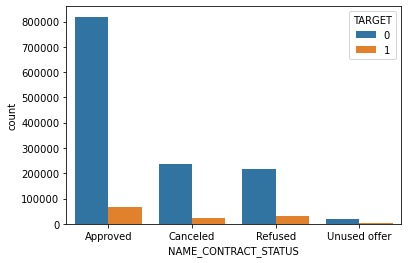

In [250]:
sns.countplot(data = merged_df, x = 'NAME_CONTRACT_STATUS', hue = 'TARGET')

**Conclusion:**

* Most of the Canceled and Refused loan application was from repairs.

<AxesSubplot:xlabel='NAME_CONTRACT_STATUS', ylabel='AMT_INCOME_TOTAL'>

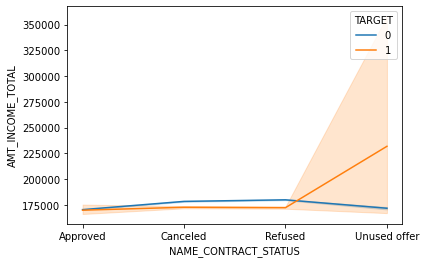

In [251]:
sns.lineplot(data = merged_df, x = 'NAME_CONTRACT_STATUS', y = 'AMT_INCOME_TOTAL', hue = 'TARGET')

**Conclusion:**

* Offers that were unused previously now have maximum number of defaulters despite of having high income customers.

# Final Remark:

**Recommendation:**

* Focus on giving Cash Loan to the Customer.
* Bank should Target customers:
1. Low Income Cusomters, income below 1 million.
2. The credit amount should not be more than 1 million
3. Annuity can be made of 0 to 70k depending upon the eligibility critera (Income and Annuity scale should be increased linearly not rapidly)
4. Provide less than 2 million of loan to customers who can pay annuity of 100k.
5. Organization Type: Others, Business Entity type 3 and Self Employed can be targated as they have less chances to default.
6. Occupation type: Accountant, Core Staff, Managers and Leborers will less likely default their loan. Encouraging these occupation type client will prove out to be a plus in future.
7. People who are having self apartment/housing should be given loan after background check.
8. Married people are also safe option as they will less likely default.
9. The safest segments are Commerical Associate, Pensioner and Working income type of customers as they were the least one to default their loans.
* Most of the customers were previuously canceled/refused, turned out to be repayers. Bank should consider providing them with the loan if above stated conditons match to minimize their loan defaults.

**Precaution:**

* Bank should avoid Organization Type: Transport Type 3 as they are more likely to default their loan.
* Low skill labourers and drivers have the highest possibility to default their loan. Bank should minimize the proving loan to these occupation type.
* Customers that has highest default on their loan belong from Lower Secondary, Secondary / Secondary Special and Incomplete Higher category of education. Bank should minimize providing loans to customers who falls under these category.
* Customers who belongs from Civil Marriage and Single/ not married cateogry of group are highest in terms of defaulter.
* Offers that were previously unused and higg income customer should be avoided.